# Lending Club Case Study Project - Upgrad Batch C63 | Tejas Kapasi | kapasitejas@gmail.com  

#### **Problem Statement:** Identifying and mitigating the risk of loan default by analyzing key predictive indicators to reduce credit loss in online loan marketplace for the big consumer finance company.

#### **Business Objective:** Identification of critical applicants using EDA is the aim of this case study. To understand driving factors behind loan default.

#### Overall Approach : Functional Steps that are involved in complete analysis. 

##### Data Sourcing / Data Loading
##### Data Attributes Understanding High Level
##### Data Cleaning and Manipulation Activities 
- Missing Data Handling 
- Missing Value Imputation
- Handling Data Types
- Data Standardisation
- Filter the Data 
- Treating Outliers
##### Exploratory Data Analysis ( EDA) 
- Derived Metrics 
- Univariate Analysis
- Segmented Univariate Analysis
- Bivariate Analysis
- Multivariate Analysis
##### Data Visualisation
- Univariate Data Visualisation in Plots.
- Bivariate Data Visualisation in plots
- Multivariate Visualisation in plots.

## 1. Data Sourcing and Loading 

### First Step is to Load Libraries and Read the CSV, - Data Sourcing and Data Loading 

In [1]:
#Import the required Libraries 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#Filter Warning 
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_rows', 150)


In [2]:
# Load the data into df from CSV
#low_memory = False is passed because data set is too huge, Internally process the file in chunks, resulting in lower memory use while parsing.
loan_data_df = pd.read_csv("loan.csv",low_memory=False)

### After Data Sourcing, Now, Data Analysing, Structure, and shape and attributes familiarity starts

In [3]:
#Check the shape of the data 
print ( loan_data_df.shape )

(39717, 111)


In [4]:
#Trying to see first few rows but too many columns. 
print( loan_data_df.head(2))

        id  member_id  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0  1077501    1296599       5000         5000           4975.0   36 months   
1  1077430    1314167       2500         2500           2500.0   60 months   

  int_rate  installment grade sub_grade  ... num_tl_90g_dpd_24m  \
0   10.65%       162.87     B        B2  ...                NaN   
1   15.27%        59.83     C        C4  ...                NaN   

  num_tl_op_past_12m pct_tl_nvr_dlq  percent_bc_gt_75 pub_rec_bankruptcies  \
0                NaN            NaN               NaN                  0.0   
1                NaN            NaN               NaN                  0.0   

  tax_liens tot_hi_cred_lim total_bal_ex_mort total_bc_limit  \
0       0.0             NaN               NaN            NaN   
1       0.0             NaN               NaN            NaN   

  total_il_high_credit_limit  
0                        NaN  
1                        NaN  

[2 rows x 111 columns]


In [5]:
#Checking Data Types for all the columns. Further we will figure categorical and Quantative variables.
loan_data_df.info(max_cols=111)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 111 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    id                              39717 non-null  int64  
 1    member_id                       39717 non-null  int64  
 2    loan_amnt                       39717 non-null  int64  
 3    funded_amnt                     39717 non-null  int64  
 4    funded_amnt_inv                 39717 non-null  float64
 5    term                            39717 non-null  object 
 6    int_rate                        39717 non-null  object 
 7    installment                     39717 non-null  float64
 8    grade                           39717 non-null  object 
 9    sub_grade                       39717 non-null  object 
 10   emp_title                       37258 non-null  object 
 11   emp_length                      38642 non-null  object 
 12   home_ownership  

In [6]:
#Total Names of columns only, Sometimes, Header might have spaces and extrac characters...
list  (loan_data_df.columns)

['id',
 'member_id',
 'loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'term',
 'int_rate',
 'installment',
 'grade',
 'sub_grade',
 'emp_title',
 'emp_length',
 'home_ownership',
 'annual_inc',
 'verification_status',
 'issue_d',
 'loan_status',
 'pymnt_plan',
 'url',
 'desc',
 'purpose',
 'title',
 'zip_code',
 'addr_state',
 'dti',
 'delinq_2yrs',
 'earliest_cr_line',
 'inq_last_6mths',
 'mths_since_last_delinq',
 'mths_since_last_record',
 'open_acc',
 'pub_rec',
 'revol_bal',
 'revol_util',
 'total_acc',
 'initial_list_status',
 'out_prncp',
 'out_prncp_inv',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_pymnt_d',
 'last_pymnt_amnt',
 'next_pymnt_d',
 'last_credit_pull_d',
 'collections_12_mths_ex_med',
 'mths_since_last_major_derog',
 'policy_code',
 'application_type',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'acc_now_delinq',
 'tot_coll_amt',
 'tot_cur_

#### Data Cleaning and Handling Activities will Include below steps: 

##### 1. Fixing Rows and Columns - Empty Columns can be removed, Raws with too many missing values or Raws
don't contriute to the analysis can be dropped. 
##### 2. Fixing Missing Values - Missing values in the columns. Check % and logically drop the columns. 
##### 3. Standardising Values - Date Fields, Numeric Fields, Data Type Fixing
##### 4. Fixing Invalid Values - Some Text, Additional % sign, etc... 
##### 5. Filter the Data 
##### 6. Checking the Incorrect Data Types and correcting 
##### 7. Treating Outliers

Checklist for Fixing Rows:

1. Delete summary rows: Total, Subtotal rows
2. Delete incorrect rows: Header rows, Footer rows
3. Delete extra rows: Column number, indicators, Blank rows, Page No.
4. Filter raws and keep which is required for analysis. For example, Currently ongoing loan data would not help here. 
5. Checking any raw has inconsistencies 

Checklist for Fixing Columns:

1. Merge columns for creating unique identifiers if needed: E.g. Merge State, City into Full address
2. Split columns for more data: Split address to get State and City to analyse each separately
3. Add column names: Add column names if missing
4. Rename columns consistently: Abbreviations, encoded columns
5. Delete columns: Delete unnecessary columns, empty columns. 
6. Align misaligned columns: Dataset may have shifted columns
7. Column that has only single value. 
8. Sometimes column has too many missing values those can be removed. 

In [7]:
# Checking total null in each column of the table. 
(loan_data_df.isnull().sum()/len(loan_data_df)*100).sort_values(ascending=False)

verification_status_joint         100.000000
annual_inc_joint                  100.000000
mo_sin_old_rev_tl_op              100.000000
mo_sin_old_il_acct                100.000000
bc_util                           100.000000
bc_open_to_buy                    100.000000
avg_cur_bal                       100.000000
acc_open_past_24mths              100.000000
inq_last_12m                      100.000000
total_cu_tl                       100.000000
inq_fi                            100.000000
total_rev_hi_lim                  100.000000
all_util                          100.000000
max_bal_bc                        100.000000
open_rv_24m                       100.000000
open_rv_12m                       100.000000
il_util                           100.000000
total_bal_il                      100.000000
mths_since_rcnt_il                100.000000
open_il_24m                       100.000000
open_il_12m                       100.000000
open_il_6m                        100.000000
open_acc_6

In [8]:
#Total null columns in the data set.  Columns where all rows are null. Important to note, I am checking entirely completely null columns so that I can drop them. Its huge data set.  
total_null_columns_size = loan_data_df.columns [ loan_data_df.isnull().sum() == loan_data_df.shape[0] ].size
print(f"Total columns: {loan_data_df.columns.size}, Total missing columns: {total_null_columns_size}")

#This is interesting How much % of columns are non used? I want to know Percentage of it, Like how much of the data is actually can be used and given to process further. 
invalid_Percent_Coln = loan_data_df.columns [ loan_data_df.isnull().sum() == loan_data_df.shape[0] ].size/loan_data_df.shape[1] * 100 
print(f"Key Observation - Total Missing columns in entire data set {invalid_Percent_Coln:.2f}% ")

Total columns: 111, Total missing columns: 54
Key Observation - Total Missing columns in entire data set 48.65% 


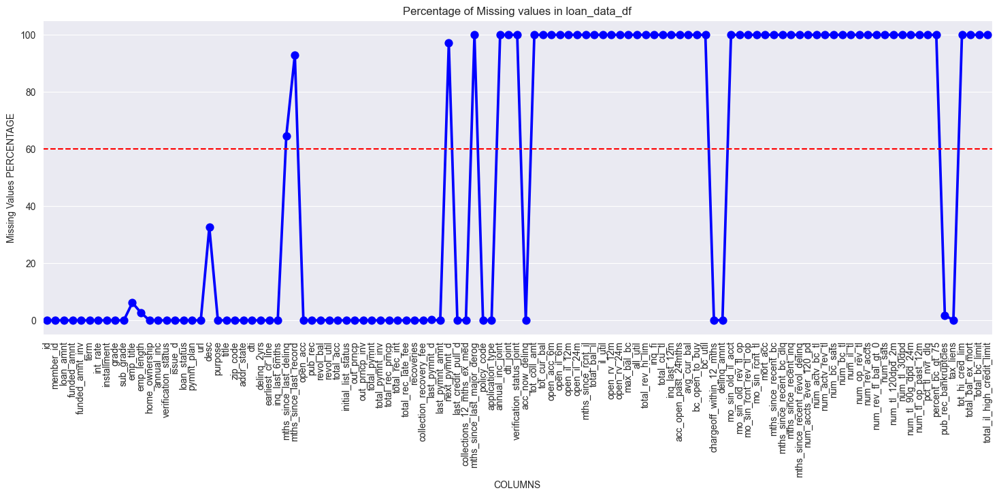

In [9]:
#Let's try to visualise how it looks like and get high level sense of missing values. 
null_loan_data_df = pd.DataFrame((loan_data_df.isnull().sum())*100/loan_data_df.shape[0]).reset_index()
null_loan_data_df.columns = ['Column Name', 'Null Values Percentage']
fig = plt.figure(figsize=(18,6))
ax = sns.pointplot(x="Column Name",y="Null Values Percentage",data=null_loan_data_df,color ='blue')
plt.xticks(rotation =90,fontsize =10)
ax.axhline(60, ls='--',color='red')
plt.title("Percentage of Missing values in loan_data_df")
plt.ylabel("Missing Values PERCENTAGE")
plt.xlabel("COLUMNS")
plt.show()


#### Observation: 
###### 48.65% is the columns are EMPTY and Can't be used, means we are removing ~50% of the data. Also , we can see many points hitting ground as well, so quite a few columns has 0 value missing. 

In [10]:
#Checking out the NULL Columns. Entire column is null, which is redundant. 
entireNullColumnNames = list(loan_data_df.columns [ loan_data_df.isnull().sum() == loan_data_df.shape[0]])
entireNullColumnNames

['mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percent_bc_gt_75',
 'tot_hi_cred_lim',
 'total_bal

In [11]:
#Doing some Cross Verify by few raws... 
loan_data_df[entireNullColumnNames].head(5)

,mths_since_last_major_derog,annual_inc_joint,dti_joint,verification_status_joint,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,...,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
loan_data_df[entireNullColumnNames].tail(5)

,mths_since_last_major_derog,annual_inc_joint,dti_joint,verification_status_joint,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,...,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
39712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39713,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39715,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
39716,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
#Let's cross verify it actually were NULL column. count() function helps for that, and we are passing above variable of missing columns here. 
loan_data_df[entireNullColumnNames].count()

mths_since_last_major_derog       0
annual_inc_joint                  0
dti_joint                         0
verification_status_joint         0
tot_coll_amt                      0
tot_cur_bal                       0
open_acc_6m                       0
open_il_6m                        0
open_il_12m                       0
open_il_24m                       0
mths_since_rcnt_il                0
total_bal_il                      0
il_util                           0
open_rv_12m                       0
open_rv_24m                       0
max_bal_bc                        0
all_util                          0
total_rev_hi_lim                  0
inq_fi                            0
total_cu_tl                       0
inq_last_12m                      0
acc_open_past_24mths              0
avg_cur_bal                       0
bc_open_to_buy                    0
bc_util                           0
mo_sin_old_il_acct                0
mo_sin_old_rev_tl_op              0
mo_sin_rcnt_rev_tl_op       

##### Applying Action 1 - Dropping Columns which are entirely empty. 

In [14]:
#### LOGIC OF DROPPING NULL COLUMNS ######
#Total Remaining columns in the data set.  
#Let's drop these identified null columns and create new DF 

#There are 2 ways of doing so, 
#1 - how='all' specifies that you want to drop the columns where all values are null.
loan_data_df_byDropNA = loan_data_df.dropna(axis=1, how='all') 

#2 - By passing the columns names. (This is for learning different ways) 
df_dropped_byDrop = loan_data_df.drop(columns=entireNullColumnNames)

print(f"loan_data_df_byDropNA : {loan_data_df_byDropNA.shape},  df_dropped_byDrop: {df_dropped_byDrop.shape}")


loan_data_df_byDropNA : (39717, 57),  df_dropped_byDrop: (39717, 57)


In [15]:
## Ideally in Real world I would go through all Null columns metadata dictionary to see if some important columns are missed out or not. Here assuming data set is proper without any mistake from provider. In case of important columns missing, We can reach out to provider of the data and business person to get the data.

In [16]:
entireNullColumnNames

['mths_since_last_major_derog',
 'annual_inc_joint',
 'dti_joint',
 'verification_status_joint',
 'tot_coll_amt',
 'tot_cur_bal',
 'open_acc_6m',
 'open_il_6m',
 'open_il_12m',
 'open_il_24m',
 'mths_since_rcnt_il',
 'total_bal_il',
 'il_util',
 'open_rv_12m',
 'open_rv_24m',
 'max_bal_bc',
 'all_util',
 'total_rev_hi_lim',
 'inq_fi',
 'total_cu_tl',
 'inq_last_12m',
 'acc_open_past_24mths',
 'avg_cur_bal',
 'bc_open_to_buy',
 'bc_util',
 'mo_sin_old_il_acct',
 'mo_sin_old_rev_tl_op',
 'mo_sin_rcnt_rev_tl_op',
 'mo_sin_rcnt_tl',
 'mort_acc',
 'mths_since_recent_bc',
 'mths_since_recent_bc_dlq',
 'mths_since_recent_inq',
 'mths_since_recent_revol_delinq',
 'num_accts_ever_120_pd',
 'num_actv_bc_tl',
 'num_actv_rev_tl',
 'num_bc_sats',
 'num_bc_tl',
 'num_il_tl',
 'num_op_rev_tl',
 'num_rev_accts',
 'num_rev_tl_bal_gt_0',
 'num_sats',
 'num_tl_120dpd_2m',
 'num_tl_30dpd',
 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m',
 'pct_tl_nvr_dlq',
 'percent_bc_gt_75',
 'tot_hi_cred_lim',
 'total_bal

In [17]:
loan_data_df_byDropNA.shape

(39717, 57)

Let's create new variable to continue changes on it. 

In [18]:
#Creating copy of new df and will work on it further. 
loan_data_df_curated = loan_data_df_byDropNA.copy()

loan_data_df_curated.shape

(39717, 57)

In [19]:
#Let's check the names of the columns, and try to understand what's it about. 
loan_data_df_curated.columns

Index(['id', 'member_id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv',
       'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'emp_title',
       'emp_length', 'home_ownership', 'annual_inc', 'verification_status',
       'issue_d', 'loan_status', 'pymnt_plan', 'url', 'desc', 'purpose',
       'title', 'zip_code', 'addr_state', 'dti', 'delinq_2yrs',
       'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq',
       'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal',
       'revol_util', 'total_acc', 'initial_list_status', 'out_prncp',
       'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp',
       'total_rec_int', 'total_rec_late_fee', 'recoveries',
       'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt',
       'next_pymnt_d', 'last_credit_pull_d', 'collections_12_mths_ex_med',
       'policy_code', 'application_type', 'acc_now_delinq',
       'chargeoff_within_12_mths', 'delinq_amnt', 'pub_rec_bankruptcies',
       'tax_

In [20]:
#Now, Let's try to see data further to see how much of the columns are missing data in combine dataframe, Categorical and Numerical. 
loan_data_df_curated.isnull().sum().sort_values(ascending=False)


next_pymnt_d                  38577
mths_since_last_record        36931
mths_since_last_delinq        25682
desc                          12942
emp_title                      2459
emp_length                     1075
pub_rec_bankruptcies            697
last_pymnt_d                     71
chargeoff_within_12_mths         56
collections_12_mths_ex_med       56
revol_util                       50
tax_liens                        39
title                            11
last_credit_pull_d                2
home_ownership                    0
int_rate                          0
out_prncp_inv                     0
total_pymnt                       0
total_pymnt_inv                   0
total_rec_prncp                   0
total_rec_int                     0
total_rec_late_fee                0
recoveries                        0
collection_recovery_fee           0
term                              0
last_pymnt_amnt                   0
initial_list_status               0
funded_amnt_inv             

In [21]:
#Let's find the percentage and see which columns are missing the Highest data.  
((loan_data_df_curated.isnull().sum() / loan_data_df_curated.shape[0]) * 100 ).sort_values(ascending=False)

next_pymnt_d                  97.129693
mths_since_last_record        92.985372
mths_since_last_delinq        64.662487
desc                          32.585543
emp_title                      6.191303
emp_length                     2.706650
pub_rec_bankruptcies           1.754916
last_pymnt_d                   0.178765
chargeoff_within_12_mths       0.140998
collections_12_mths_ex_med     0.140998
revol_util                     0.125891
tax_liens                      0.098195
title                          0.027696
last_credit_pull_d             0.005036
home_ownership                 0.000000
int_rate                       0.000000
out_prncp_inv                  0.000000
total_pymnt                    0.000000
total_pymnt_inv                0.000000
total_rec_prncp                0.000000
total_rec_int                  0.000000
total_rec_late_fee             0.000000
recoveries                     0.000000
collection_recovery_fee        0.000000
term                           0.000000


###### Let's create table which can clearly represent missing count and %

In [22]:
#This function basically summarize missing values and create readable table 
def summarize_missing_values(df):
    # Calculate the total number of rows in the DataFrame
    total_rows = df.shape[0]

    # Calculate the number of missing values for each column
    missing_values_count = df.isnull().sum()

    # Calculate the percentage of missing values for each column
    missing_values_percentage = (missing_values_count / total_rows) * 100

    # Create a DataFrame from the missing values count
    missing_values_count_df = pd.DataFrame(missing_values_count, columns=['missing_count'])

    # Create a DataFrame from the missing values percentage
    missing_values_percentage_df = pd.DataFrame(missing_values_percentage, columns=['missing_percentage'])

    # Concatenate the two DataFrames along the columns
    missing_data_df = pd.concat([missing_values_count_df, missing_values_percentage_df, df.dtypes.rename('dtype')], axis=1)

    # Sort the DataFrame by the percentage of missing values in descending order
    missing_data_df_sorted = missing_data_df.sort_values(by='missing_percentage', ascending=False)

    # Print the total number of rows
    print(f"total_rows: {total_rows}")

    # Return the sorted DataFrame
    return missing_data_df_sorted


In [23]:
missing_data_summary = summarize_missing_values(loan_data_df_curated)
print(missing_data_summary)

total_rows: 39717
                            missing_count  missing_percentage    dtype
next_pymnt_d                        38577           97.129693   object
mths_since_last_record              36931           92.985372  float64
mths_since_last_delinq              25682           64.662487  float64
desc                                12942           32.585543   object
emp_title                            2459            6.191303   object
emp_length                           1075            2.706650   object
pub_rec_bankruptcies                  697            1.754916  float64
last_pymnt_d                           71            0.178765   object
chargeoff_within_12_mths               56            0.140998  float64
collections_12_mths_ex_med             56            0.140998  float64
revol_util                             50            0.125891   object
tax_liens                              39            0.098195  float64
title                                  11            0.0276

In [24]:
#In nutshell, How many attributes we need to handle for Data cleaning now, is where Missing percentage is >0, and we can see how can we deal with all of them individually. 
missing_data_summary[missing_data_summary['missing_percentage'] >0]

,missing_count,missing_percentage,dtype
next_pymnt_d,38577,97.129693,object
mths_since_last_record,36931,92.985372,float64
mths_since_last_delinq,25682,64.662487,float64
desc,12942,32.585543,object
emp_title,2459,6.191303,object
emp_length,1075,2.706650,object
pub_rec_bankruptcies,697,1.754916,float64
last_pymnt_d,71,0.178765,object
chargeoff_within_12_mths,56,0.140998,float64
collections_12_mths_ex_med,56,0.140998,float64


### Handling Missing data and Imputation

Anything more than 60% is missing is not worth it to impute. And better to drop those columns. 

In [25]:
#Let's drop 3 more columns. 
loan_data_df_curated.drop(['next_pymnt_d','mths_since_last_record','mths_since_last_delinq'], axis=1, inplace=True)

In [26]:
loan_data_df_curated.shape

(39717, 54)

Now, Let us handle all these attributes one by one. Impute or Drop is the decision we will take. 

In [27]:
missing_data_summary = summarize_missing_values(loan_data_df_curated)
print(missing_data_summary)

total_rows: 39717
                            missing_count  missing_percentage    dtype
desc                                12942           32.585543   object
emp_title                            2459            6.191303   object
emp_length                           1075            2.706650   object
pub_rec_bankruptcies                  697            1.754916  float64
last_pymnt_d                           71            0.178765   object
collections_12_mths_ex_med             56            0.140998  float64
chargeoff_within_12_mths               56            0.140998  float64
revol_util                             50            0.125891   object
tax_liens                              39            0.098195  float64
title                                  11            0.027696   object
last_credit_pull_d                      2            0.005036   object
total_rec_prncp                         0            0.000000  float64
out_prncp                               0            0.0000

In [28]:
loan_data_df_curated.loan_status.value_counts()

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

In [29]:
loan_data_df_curated.funded_amnt_inv.value_counts()

funded_amnt_inv
5000.000000     1309
10000.000000    1275
6000.000000     1200
12000.000000    1069
8000.000000      900
                ... 
4944.213109        1
18400.281660       1
14659.820000       1
6294.151315        1
11808.924370       1
Name: count, Length: 8205, dtype: int64

In [30]:
loan_data_df_curated.funded_amnt_inv.size

39717

In [31]:
missing_data_summary = summarize_missing_values(loan_data_df_curated)
missing_data_summary[missing_data_summary['missing_percentage'] >0]

total_rows: 39717


,missing_count,missing_percentage,dtype
desc,12942,32.585543,object
emp_title,2459,6.191303,object
emp_length,1075,2.706650,object
pub_rec_bankruptcies,697,1.754916,float64
last_pymnt_d,71,0.178765,object
collections_12_mths_ex_med,56,0.140998,float64
chargeoff_within_12_mths,56,0.140998,float64
revol_util,50,0.125891,object
tax_liens,39,0.098195,float64
title,11,0.027696,object


Let me hold on here, Reflect and pause on what are we doing. Let me remind myself we are doing data cleaning and while doing so, Trying to understand data and keeping the problem statement in mind. 

#### Key Points to notice here and Time to understand some columns. 
1. There are some columns which were completely empty that are dropped. 
2. There are some columns which were having more tha 60% data missing, those are dropped.
3. In case study statement it has mentioned, We will use "Consumer Attributes" and "Loan Attributes" that influence the tendency to default. 
4. Basically ultimate AIM for this to find driving factors behind loan default. Variables whcih are strong indicators of default. **loan_status** can be considered as target variable in this analysis.  
5. **loan_status** has 3 unique values, "Fully Paid", "Charged Off", "Current". We don't know the result for the "Current" customers whether they will default or Fully Pay upon completion of loan tenure, we should drop Current Loan holders rows. "Charged Off" is equal to Defaulters  
6. Some additional columns , by going through data dictionary, not required. We should drop them. member_id, zipcode etc...

#### Plan of Action for further Data Cleaning and Handling
1. Treat missing values in the columns. (Dropping columns which are not required for analysis and not making sense) 
2. Dropping raws where it is missing values by carefully evaluating. Filter rows to perform required analysis 
3. Imputations in missing values 
4. Data Type Corrections 
5. Removing Outliers. 

In [32]:
#Now, Looking at the dictionary and not required columns can be dropped out. 
#Let's look at all columns
loan_data_df_curated.columns.sort_values(ascending=True)

Index(['acc_now_delinq', 'addr_state', 'annual_inc', 'application_type',
       'chargeoff_within_12_mths', 'collection_recovery_fee',
       'collections_12_mths_ex_med', 'delinq_2yrs', 'delinq_amnt', 'desc',
       'dti', 'earliest_cr_line', 'emp_length', 'emp_title', 'funded_amnt',
       'funded_amnt_inv', 'grade', 'home_ownership', 'id',
       'initial_list_status', 'inq_last_6mths', 'installment', 'int_rate',
       'issue_d', 'last_credit_pull_d', 'last_pymnt_amnt', 'last_pymnt_d',
       'loan_amnt', 'loan_status', 'member_id', 'open_acc', 'out_prncp',
       'out_prncp_inv', 'policy_code', 'pub_rec', 'pub_rec_bankruptcies',
       'purpose', 'pymnt_plan', 'recoveries', 'revol_bal', 'revol_util',
       'sub_grade', 'tax_liens', 'term', 'title', 'total_acc', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_int', 'total_rec_late_fee',
       'total_rec_prncp', 'url', 'verification_status', 'zip_code'],
      dtype='object')

##### Now, Let's review and understand this and also start removing those which are not required for analysis. 

Not Required Columns: 
1. id - It's unique Id for the applicants - Doesn't drive loan status 
2. member_id - Same as Id, It's unique member Id - Doesn't drive loan Status 
3. collection_recovery_fee - post charge off collection fee - Doesn't drive loan status 
4. delinq_2yrs - The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years 
5. desc - Description Text - Doesn't help to analyse loan status 
6. inq_last_6mnths - The number of inquiries in past 6 months (excluding auto and mortgage inquiries) - Doesn't help for outcome variable. 
7. last_credit_pull_d - The most recent month LC pulled credit for this loan - Doesn't help, last credit report pulled. 
8. last_payment_d - Last month payment was received - Doesn't again help for driving loan status 
9. open_acc - The number of open credit lines in the borrower's credit file. - I feel this can't be driving factor for Loan Status again. 
10. pub_rec - Number of derogatory public records - This is again not required, Public data for this variable is not reliable. 
11. recoveries - post charge off gross recovery - Doesn't help for Loan Status analysis. 
12. revol_bal - Total credit revolving balance - This is not relevant for loan Status. 
13. total_acc - The total number of credit lines currently in the borrower's credit file
14. total_rec_late_fee - Late fees received to date
15. url
16. zip_code

In [33]:
not_required_cols = ['id','member_id','collection_recovery_fee','delinq_2yrs','desc','inq_last_6mths','last_credit_pull_d','last_pymnt_d','open_acc','pub_rec','recoveries','revol_bal','total_acc','total_rec_late_fee','url','zip_code']
print ( f"Total not required columns : { len(not_required_cols) } " )


Total not required columns : 16 


In [34]:
loan_data_df_curated.shape

(39717, 54)

In [35]:
#Now, Let's remove all these columns further. 
loan_data_df_curated.drop(not_required_cols,axis=1,inplace=True)

In [36]:
loan_data_df_curated.shape

(39717, 38)

In [37]:
#Let's further curate the column where values are unique 1 value, means its constant. 
loan_data_df_curated.nunique().sort_values()

tax_liens                         1
pymnt_plan                        1
initial_list_status               1
collections_12_mths_ex_med        1
application_type                  1
policy_code                       1
chargeoff_within_12_mths          1
delinq_amnt                       1
acc_now_delinq                    1
term                              2
verification_status               3
loan_status                       3
pub_rec_bankruptcies              3
home_ownership                    5
grade                             7
emp_length                       11
purpose                          14
sub_grade                        35
addr_state                       50
issue_d                          55
int_rate                        371
earliest_cr_line                526
loan_amnt                       885
funded_amnt                    1041
revol_util                     1089
out_prncp                      1137
out_prncp_inv                  1138
dti                         

Let's see the meaning of this and prepare list to drop constant values columns.
1. tax_liens - Number of tax liens
2. pymnt_plan
3. initial_list_status
4. collections_12_mths_ex_med
5. application_type
6. policy_code
7. chargeoff_within_12_mths
8. delinq_amnt
9. acc_now_delinq

In [38]:
list_const_colns = loan_data_df_curated.nunique()[loan_data_df_curated.nunique() == 1].index.tolist()
list_const_colns

['pymnt_plan',
 'initial_list_status',
 'collections_12_mths_ex_med',
 'policy_code',
 'application_type',
 'acc_now_delinq',
 'chargeoff_within_12_mths',
 'delinq_amnt',
 'tax_liens']

In [39]:
#Let's remove the constant columns 
loan_data_df_curated.drop(list_const_colns,axis=1,inplace=True)

In [40]:
loan_data_df_curated.shape

(39717, 29)

In [41]:
#Let's check how many columns we have to analyse. 
loan_data_df_curated.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'purpose', 'title', 'addr_state', 'dti',
       'earliest_cr_line', 'revol_util', 'out_prncp', 'out_prncp_inv',
       'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'last_pymnt_amnt', 'pub_rec_bankruptcies'],
      dtype='object')

In [42]:
loan_data_df_curated.isnull().sum()

loan_amnt                  0
funded_amnt                0
funded_amnt_inv            0
term                       0
int_rate                   0
installment                0
grade                      0
sub_grade                  0
emp_title               2459
emp_length              1075
home_ownership             0
annual_inc                 0
verification_status        0
issue_d                    0
loan_status                0
purpose                    0
title                     11
addr_state                 0
dti                        0
earliest_cr_line           0
revol_util                50
out_prncp                  0
out_prncp_inv              0
total_pymnt                0
total_pymnt_inv            0
total_rec_prncp            0
total_rec_int              0
last_pymnt_amnt            0
pub_rec_bankruptcies     697
dtype: int64

In [43]:
#Let's see if any columns has still some potential to be dropped out. 
#pub_rec_bankruptcies - I think this will not help us as its not true source to rely on and driving loan status. 
loan_data_df_curated.pub_rec_bankruptcies.value_counts()

pub_rec_bankruptcies
0.0    37339
1.0     1674
2.0        7
Name: count, dtype: int64

In [44]:
#total_rec_int - Total Received Interest - This also doesn't drive anything for Loan Status target variable. 
loan_data_df_curated.revol_util.value_counts()

revol_util
0%        977
0.20%      63
63%        62
40.70%     58
66.70%     58
         ... 
25.74%      1
47.36%      1
24.65%      1
10.61%      1
7.28%       1
Name: count, Length: 1089, dtype: int64

In [45]:
loan_data_df_curated.verification_status.value_counts()

verification_status
Not Verified       16921
Verified           12809
Source Verified     9987
Name: count, dtype: int64

In [46]:
#earliest_cr_line - The month the borrower's earliest reported credit line was opened - Doesn't require this column. 

In [47]:
loan_data_df_curated.drop(['pub_rec_bankruptcies','total_rec_int','earliest_cr_line'],axis=1,inplace=True)

In [48]:
loan_data_df_curated.shape

(39717, 26)

In [49]:
loan_data_df_curated.columns.sort_values(ascending=True)

Index(['addr_state', 'annual_inc', 'dti', 'emp_length', 'emp_title',
       'funded_amnt', 'funded_amnt_inv', 'grade', 'home_ownership',
       'installment', 'int_rate', 'issue_d', 'last_pymnt_amnt', 'loan_amnt',
       'loan_status', 'out_prncp', 'out_prncp_inv', 'purpose', 'revol_util',
       'sub_grade', 'term', 'title', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'verification_status'],
      dtype='object')

Pretty much all the attributes are dropped which are not required for the analysis. 
Let's check the rows which can be removed. 

Let's Check the Raws now.      

In [50]:
#Let's see if raws for which current loan is in progress, that can be removed. Because that will not help in driving outcome on loan status as its already in progress.     

In [51]:
loan_data_df_curated.loan_status.value_counts()

loan_status
Fully Paid     32950
Charged Off     5627
Current         1140
Name: count, dtype: int64

In [52]:
#Let's remove the raws where Loan_Status="Current". 
loan_data_df_curated = loan_data_df_curated[loan_data_df_curated.loan_status != "Current"]

In [53]:
loan_data_df_curated.shape

(38577, 26)

Let's check all the raws has enough data for the analysis or not.   

In [54]:
#Let's check the percentage of missing columns for all the raws and if it's too huge we can remove those raws. 
(loan_data_df_curated.isnull().sum(axis=1)/loan_data_df_curated.shape[1]*100).sort_values(ascending=False)

4714     11.538462
11282    11.538462
24984    11.538462
28700    11.538462
19525     7.692308
           ...    
14362     0.000000
14363     0.000000
14365     0.000000
14367     0.000000
39716     0.000000
Length: 38577, dtype: float64

It doesn't look like there are huge % of data missing on raw levels. 

In [55]:
loan_data_df_curated.columns

Index(['loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate',
       'installment', 'grade', 'sub_grade', 'emp_title', 'emp_length',
       'home_ownership', 'annual_inc', 'verification_status', 'issue_d',
       'loan_status', 'purpose', 'title', 'addr_state', 'dti', 'revol_util',
       'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv',
       'total_rec_prncp', 'last_pymnt_amnt'],
      dtype='object')

In [56]:
loan_data_df_curated[['loan_amnt','funded_amnt','funded_amnt_inv']]

,loan_amnt,funded_amnt,funded_amnt_inv
0,5000,5000,4975.0
1,2500,2500,2500.0
2,2400,2400,2400.0
3,10000,10000,10000.0
5,5000,5000,5000.0
...,...,...,...
39712,2500,2500,1075.0
39713,8500,8500,875.0
39714,5000,5000,1325.0
39715,5000,5000,650.0


In [57]:
#Let's check a couple of scenarios, Whether there's a scenario fund is given more than loan amount. 
#1 - Is funded_amnt is > loan_amnt ? 
#2 - Is funded_amnt is < funded_amnt_inv ? 
#3 - Is funded_amnt_inv > loan_amnt ? 
print(loan_data_df_curated.query('funded_amnt > loan_amnt')[['loan_amnt', 'funded_amnt', 'funded_amnt_inv']])

print(loan_data_df_curated.query('funded_amnt < funded_amnt_inv')[['loan_amnt', 'funded_amnt', 'funded_amnt_inv']])

print(loan_data_df_curated.query('loan_amnt < funded_amnt_inv')[['loan_amnt', 'funded_amnt', 'funded_amnt_inv']])


Empty DataFrame
Columns: [loan_amnt, funded_amnt, funded_amnt_inv]
Index: []
Empty DataFrame
Columns: [loan_amnt, funded_amnt, funded_amnt_inv]
Index: []
Empty DataFrame
Columns: [loan_amnt, funded_amnt, funded_amnt_inv]
Index: []


I think, We have worked on Cleaning of Columns and Raws, Now, Lets further deep dive into this and see if there's a need of Missing Value Imputation or not.   

In [58]:
loan_data_df_curated.isnull().sum()

loan_amnt                 0
funded_amnt               0
funded_amnt_inv           0
term                      0
int_rate                  0
installment               0
grade                     0
sub_grade                 0
emp_title              2386
emp_length             1033
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
purpose                   0
title                    11
addr_state                0
dti                       0
revol_util               50
out_prncp                 0
out_prncp_inv             0
total_pymnt               0
total_pymnt_inv           0
total_rec_prncp           0
last_pymnt_amnt           0
dtype: int64

In [59]:
loan_data_df_curated.isnull().sum()[lambda x: x > 0]

emp_title     2386
emp_length    1033
title           11
revol_util      50
dtype: int64

In [60]:
#Wanted to check Execution time so, I can understand lambda vs comprehension functions. 
loan_data_df_curated.isnull().sum()[loan_data_df_curated.isnull().sum() > 0]

emp_title     2386
emp_length    1033
title           11
revol_util      50
dtype: int64

Let's review each of this attributes one by one and if required to impute let's impute it

In [61]:
#emp_title 
cnt_emp = loan_data_df_curated.isnull().sum()[loan_data_df_curated.isnull().sum() > 0]['emp_title']
print(f"Total missing percentage for emp_title is: {cnt_emp / loan_data_df_curated.shape[0] * 100 :.2f}")

loan_data_df_curated.emp_title.value_counts()

Total missing percentage for emp_title is: 6.19


emp_title
US Army                                     131
Bank of America                             107
IBM                                          65
AT&T                                         57
Kaiser Permanente                            56
                                           ... 
amneal pharmaceuticals                        1
Net Equity Financial                          1
Kernersville Fire Department                  1
The Keith Corp. (empl by county, now Kei      1
Evergreen Center                              1
Name: count, Length: 28027, dtype: int64

In [62]:
#Let's Try to Normalise and See, Give it a shot, Else we will drop this as well.
# Normalise the emp_title by stripping and converting to lowercase
loan_data_df_curated['normalized_title'] = loan_data_df_curated['emp_title'].str.strip().str.lower()

# Group by the normalized title and use 'first' to take the first original value
loan_data_df_curated['deduplicated_title'] = loan_data_df_curated.groupby('normalized_title')['emp_title'].transform('first')

# Now df['deduplicated_title'] contains the deduplicated titles


loan_data_df_curated.deduplicated_title.value_counts()

deduplicated_title
US Army                   208
Bank of America           133
At&T                       81
walmart                    79
wells fargo                69
                         ... 
Stevens Aviation            1
Valir Health                1
ESAB                        1
Whole Health Dentistry      1
Evergreen Center            1
Name: count, Length: 26474, dtype: int64

In [63]:
#This 2 columns we can remove as it's not required.
loan_data_df_curated.drop(['normalized_title','deduplicated_title'],axis=1,inplace=True)

In [64]:
#This looks like Categorical Variable, But Imputing with any specific value doens't seem right way of imputing. This won't drive output varibale. I would carefully think to drop this column. 
loan_data_df_curated.drop(['emp_title'],axis=1,inplace=True)

In [65]:
#Let's do the analysis for emp_length

In [66]:
#emp_length 
cnt_emp_length = loan_data_df_curated.isnull().sum()[loan_data_df_curated.isnull().sum() > 0]['emp_length']
print(f"Total missing percentage for emp_title is: {cnt_emp_length / loan_data_df_curated.shape[0] * 100 :.2f}")

loan_data_df_curated.emp_length.value_counts()

Total missing percentage for emp_title is: 2.68


emp_length
10+ years    8488
< 1 year     4508
2 years      4291
3 years      4012
4 years      3342
5 years      3194
1 year       3169
6 years      2168
7 years      1711
8 years      1435
9 years      1226
Name: count, dtype: int64

In [67]:
#I think the missing values could be because those are candidates who have no employers, but they are doing business. These can be classified as "Self Employed" 
loan_data_df_curated["emp_length"] = loan_data_df_curated["emp_length"].fillna("Self Employed")

In [68]:
loan_data_df_curated.emp_length.value_counts()

emp_length
10+ years        8488
< 1 year         4508
2 years          4291
3 years          4012
4 years          3342
5 years          3194
1 year           3169
6 years          2168
7 years          1711
8 years          1435
9 years          1226
Self Employed    1033
Name: count, dtype: int64

In [69]:
loan_data_df_curated.title.value_counts()

title
Debt Consolidation           2090
Debt Consolidation Loan      1620
Personal Loan                 641
Consolidation                 491
debt consolidation            478
                             ... 
Murray Loan                     1
Need debt consolidation!        1
freedom2                        1
DAVE WEDDING                    1
JAL Loan                        1
Name: count, Length: 19297, dtype: int64

In [70]:
#This is not the driving factor to consider default or not. We can drop this column.    

In [71]:
loan_data_df_curated.drop(['title'],axis=1,inplace=True)
loan_data_df_curated.shape

(38577, 24)

In [72]:
#revol_util - Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
cnt_revol_util_length = loan_data_df_curated.isnull().sum()[loan_data_df_curated.isnull().sum() > 0]['revol_util']
print(f"Total missing percentage for revol_util is: {cnt_revol_util_length / loan_data_df_curated.shape[0] * 100 :.2f}")

loan_data_df_curated.revol_util.value_counts()

Total missing percentage for revol_util is: 0.13


revol_util
0%        954
0.20%      62
63%        62
40.70%     57
31.20%     57
         ... 
77.63%      1
25.74%      1
0.83%       1
47.36%      1
7.28%       1
Name: count, Length: 1088, dtype: int64

In [73]:
#I think, better would be conver it into float data type would be much easier after removing % sign. 
loan_data_df_curated['revol_util'] = loan_data_df_curated['revol_util'].str.replace('%', '').astype(float)

In [74]:
loan_data_df_curated.revol_util.value_counts()

revol_util
0.00     954
0.20      62
63.00     62
40.70     57
31.20     57
        ... 
77.63      1
25.74      1
0.83       1
47.36      1
7.28       1
Name: count, Length: 1088, dtype: int64

In [75]:
loan_data_df_curated.revol_util.describe()

count    38527.000000
mean        48.702777
std         28.364741
min          0.000000
25%         25.200000
50%         49.100000
75%         72.300000
max         99.900000
Name: revol_util, dtype: float64

In [76]:
loan_data_df_curated.revol_util.mean()

48.70277675396475

In [77]:
missing_data_summary = summarize_missing_values(loan_data_df_curated)
missing_data_summary[missing_data_summary['missing_percentage'] >0]

total_rows: 38577


,missing_count,missing_percentage,dtype
revol_util,50,0.129611,float64


Let's impute this with mean() so, we can use this to check credit worthiness of the applicants.


In [78]:
#Let's impute by mean() and do the rounding to 2
loan_data_df_curated['revol_util'].fillna(round(loan_data_df_curated.revol_util.mean(),2), inplace=True)

In [79]:
loan_data_df_curated.revol_util.isnull().sum()

0

In [80]:
missing_data_summary = summarize_missing_values(loan_data_df_curated)
missing_data_summary[missing_data_summary['missing_percentage'] >0]

total_rows: 38577


,missing_count,missing_percentage,dtype


## At this point, now we have cleaned final data sets is available to process further. (No, Raws and No Columns has any missing data)

#### Next Step would be doing data type check. Segregating variables into Categorical and Numerical Variables.

In [81]:
#Let's look at the data types. 

In [82]:
loan_data_df_curated.dtypes

loan_amnt                int64
funded_amnt              int64
funded_amnt_inv        float64
term                    object
int_rate                object
installment            float64
grade                   object
sub_grade               object
emp_length              object
home_ownership          object
annual_inc             float64
verification_status     object
issue_d                 object
loan_status             object
purpose                 object
addr_state              object
dti                    float64
revol_util             float64
out_prncp              float64
out_prncp_inv          float64
total_pymnt            float64
total_pymnt_inv        float64
total_rec_prncp        float64
last_pymnt_amnt        float64
dtype: object

In [83]:
loan_data_df_curated.dtypes.value_counts()

float64    11
object     11
int64       2
Name: count, dtype: int64

This is done, to see how many attributes we would need to convert.

In [84]:
#funded_amnt_inv - Float to Int.
loan_data_df_curated.funded_amnt_inv.value_counts()

funded_amnt_inv
5000.000000     1294
10000.000000    1264
6000.000000     1182
12000.000000    1016
8000.000000      887
                ... 
5913.729658        1
24240.110000       1
16458.930000       1
18911.950000       1
7959.595570        1
Name: count, Length: 8050, dtype: int64

Observation - So, This funded_amnt_inv can be converted into int.

In [85]:
# term - Object to Int.
loan_data_df_curated.term.value_counts()

term
 36 months    29096
 60 months     9481
Name: count, dtype: int64

Observation - **term** can also be convered to int after removing "months"

In [86]:
#int_rate - Object to float
loan_data_df_curated.int_rate.value_counts()

int_rate
10.99%    913
11.49%    790
7.51%     787
13.49%    749
7.88%     725
         ... 
16.96%      1
18.36%      1
16.15%      1
16.01%      1
16.20%      1
Name: count, Length: 370, dtype: int64

Observation - **int_rate** can be convered to float after removing %

In [87]:
#grade Object to keep as it is.
loan_data_df_curated.grade.value_counts()

grade
B    11675
A    10045
C     7834
D     5085
E     2663
F      976
G      299
Name: count, dtype: int64

Observation - Grade, Subgrade can be kept as it is.

In [88]:
#emp_length Object to keep as it is.
loan_data_df_curated.emp_length.value_counts()

emp_length
10+ years        8488
< 1 year         4508
2 years          4291
3 years          4012
4 years          3342
5 years          3194
1 year           3169
6 years          2168
7 years          1711
8 years          1435
9 years          1226
Self Employed    1033
Name: count, dtype: int64

Observation - IT's fine, to keep this emp_length as is.

In [89]:
loan_data_df_curated.annual_inc.value_counts()

annual_inc
60000.0     1466
50000.0     1029
40000.0      855
45000.0      811
30000.0      808
            ... 
80569.0        1
82116.0        1
242400.0       1
133300.0       1
27376.0        1
Name: count, Length: 5215, dtype: int64

Observation - Anyway annual_inc variable not required to be floated. It can be converted to Int.

In [90]:
#issued_d = Object
loan_data_df_curated.issue_d.value_counts()

issue_d
Nov-11    2062
Dec-11    2042
Oct-11    1941
Sep-11    1913
Aug-11    1798
Jul-11    1745
Jun-11    1728
May-11    1609
Apr-11    1559
Mar-11    1442
Jan-11    1380
Feb-11    1297
Dec-10    1267
Oct-10    1132
Nov-10    1121
Jul-10    1119
Sep-10    1086
Aug-10    1078
Jun-10    1029
May-10     920
Apr-10     827
Mar-10     737
Feb-10     627
Nov-09     602
Dec-09     598
Jan-10     589
Oct-09     545
Sep-09     449
Aug-09     408
Jul-09     374
Jun-09     356
May-09     319
Apr-09     290
Mar-09     276
Feb-09     260
Jan-09     239
Mar-08     236
Dec-08     223
Nov-08     184
Feb-08     174
Jan-08     171
Apr-08     155
Oct-08      96
Dec-07      85
Jul-08      83
May-08      71
Aug-08      71
Jun-08      66
Oct-07      47
Nov-07      37
Aug-07      33
Sep-08      32
Jul-07      30
Sep-07      18
Jun-07       1
Name: count, dtype: int64

This can be split into two column I think, Month and Year. 

In [91]:
#dti - float.
loan_data_df_curated.dti.value_counts()

dti
0.00     178
12.00     46
18.00     45
19.20     39
13.20     39
        ... 
28.95      1
25.85      1
25.77      1
27.20      1
25.43      1
Name: count, Length: 2853, dtype: int64

In [92]:
loan_data_df_curated.out_prncp.value_counts()

out_prncp
0.0    38577
Name: count, dtype: int64

Observation - out_prncp this can be dropped.

In [93]:
loan_data_df_curated.out_prncp_inv.value_counts()

out_prncp_inv
0.0    38577
Name: count, dtype: int64

This out_prncp_inv can also be dropped. 

## Let's apply Standardising Values as captured above - Let me summarise actions
1. "funded_amnt_inv" can be converted into int.  
2. "int_rate" can be converted to float after removing % 
3. Anyway "annual_inc" variable not required to be floated. It can be converted to Int. 
4. term can be converted to int after removing "months" 
5. "issue_d" can be split into month and year 2 columns. 
6. "out_prncp" to be removed 
7. "out_prncp"_inv to be removed 

In [94]:
#1.Convert "funded_amnt_inv" to int
loan_data_df_curated["funded_amnt_inv"] = loan_data_df_curated.funded_amnt_inv.astype("int64")
print(loan_data_df_curated.funded_amnt_inv.dtype)

int64


In [95]:
#2. Convert "int_rate" to "float" after removing "%".
loan_data_df_curated["int_rate"] = loan_data_df_curated.int_rate.str.replace("%",'').astype('float64')
print(loan_data_df_curated.int_rate.dtype)

float64


In [96]:
#3. Convert "int_rate" to "float" after removing "%".
loan_data_df_curated["annual_inc"] = loan_data_df_curated.annual_inc.astype('int64')
print(loan_data_df_curated.annual_inc.dtype)

int64


In [97]:
#4. Convert "term" to "int" after removing " months" 
loan_data_df_curated["term"] = loan_data_df_curated.term.str.replace(" months",'').astype('int64')
print(loan_data_df_curated.term.dtype)

int64


In [98]:
#5. Split issue_d into 2 columns Month and year. expan will help us to create 2 columns. 
loan_data_df_curated[['month', 'year']] = loan_data_df_curated['issue_d'].str.split('-', expand=True)


#### This is called as Derived Metrics. 

In [99]:
loan_data_df_curated.shape

(38577, 26)

In [100]:
loan_data_df_curated.month.value_counts()

month
Dec    4215
Nov    4006
Oct    3761
Sep    3498
Aug    3388
Jul    3351
Jun    3180
May    2919
Apr    2831
Mar    2691
Jan    2379
Feb    2358
Name: count, dtype: int64

In [101]:
loan_data_df_curated.year.value_counts()

year
11    20516
10    11532
09     4716
08     1562
07      251
Name: count, dtype: int64

In [102]:
#6 and #7 - Two columns to be removed as there's no value which can help us analyse the data, 

In [103]:
loan_data_df_curated.drop(['out_prncp','out_prncp_inv'],axis=1,inplace=True)

In [104]:
loan_data_df_curated.shape

(38577, 24)

In [105]:
#Let's Check the summary of Missing % now.
missing_data_summary = summarize_missing_values(loan_data_df_curated)
missing_data_summary[missing_data_summary['missing_percentage'] >0]

total_rows: 38577


,missing_count,missing_percentage,dtype


### So, Now, We have accurate data set to start analysis. We have completed Data Cleaning, Data Imputations, Standardising Values.

## Now, Let's Handle Outliers.

In [106]:
#Let's see the data head. 
loan_data_df_curated.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,purpose,addr_state,dti,revol_util,total_pymnt,total_pymnt_inv,total_rec_prncp,last_pymnt_amnt,month,year
0,5000,5000,4975,36,10.65,162.87,B,B2,10+ years,RENT,...,credit_card,AZ,27.65,83.7,5863.155187,5833.84,5000.00,171.62,Dec,11
1,2500,2500,2500,60,15.27,59.83,C,C4,< 1 year,RENT,...,car,GA,1.00,9.4,1008.710000,1008.71,456.46,119.66,Dec,11
2,2400,2400,2400,36,15.96,84.33,C,C5,10+ years,RENT,...,small_business,IL,8.72,98.5,3005.666844,3005.67,2400.00,649.91,Dec,11
3,10000,10000,10000,36,13.49,339.31,C,C1,10+ years,RENT,...,other,CA,20.00,21.0,12231.890000,12231.89,10000.00,357.48,Dec,11
5,5000,5000,5000,36,7.90,156.46,A,A4,3 years,RENT,...,wedding,AZ,11.20,28.3,5632.210000,5632.21,5000.00,161.03,Dec,11


In [107]:
#Let's start looking at some key input variables and see outliers 

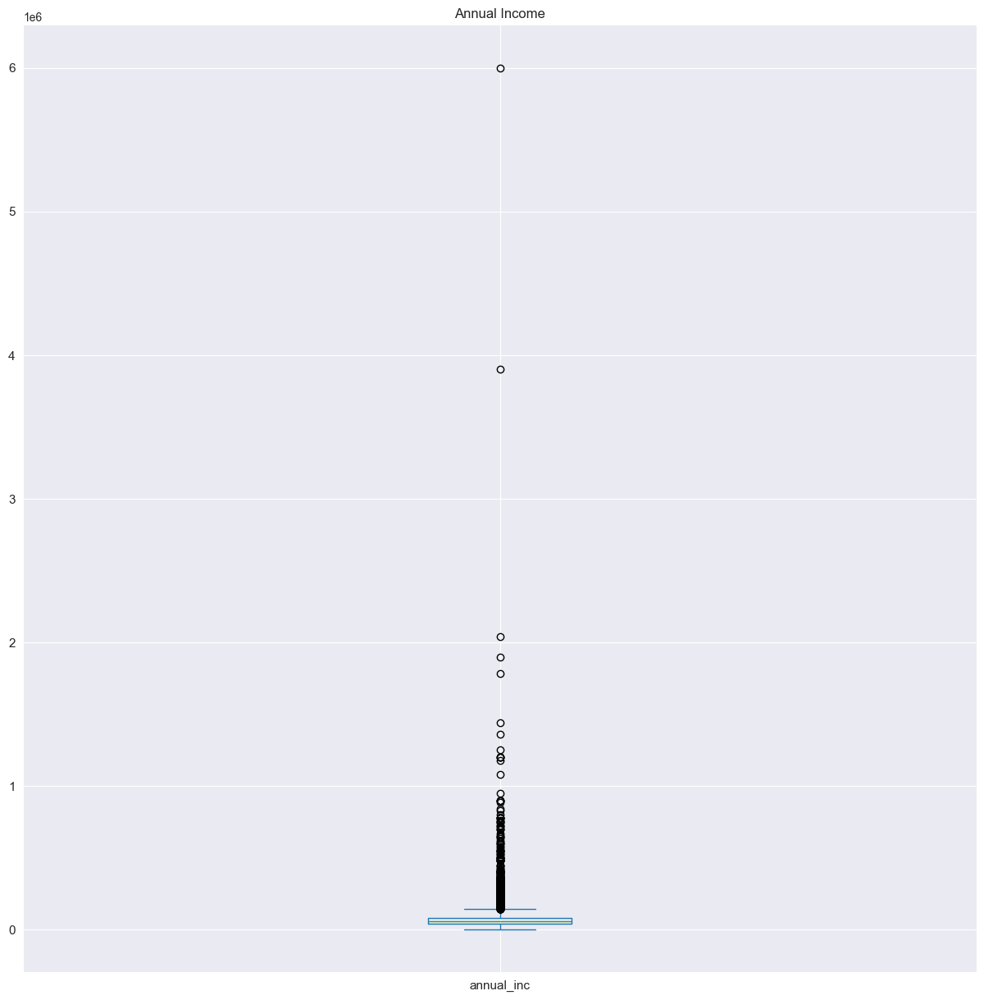

In [108]:
#1. annual_inc is the one key input variable, We know if too many outliers are there then it can affect the result when comparing with Annual Income.
#Plot boxplot to observe the outliers
loan_data_df_curated.annual_inc.plot.box(fontsize=11,figsize=(15,15)).set_title('Annual Income')

# Show the plot
plt.show()


We can clearly see the outliers from extreme right side. It shows in exponential way. So, Better way of handling this would be to see for specific quartile.

We can see starts from 0 and no negative data. Let's see quantile data in different range.

In [109]:
#This is difficult to read, let's break it down as per the smaller quantile. 
annual_inc_quartile = loan_data_df_curated.annual_inc.quantile([0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.98,0.99,1.0])
print(annual_inc_quartile)

0.01      14400.0
0.10      30000.0
0.20      37196.0
0.30      44500.0
0.40      50004.0
0.50      58868.0
0.60      65004.0
0.70      75000.0
0.80      90000.0
0.90     115000.0
0.98     187000.0
0.99     234144.0
1.00    6000000.0
Name: annual_inc, dtype: float64


In [110]:
#It looks like, outliers are <0.01 and > 0.99 quantile. Let's keep remaining and so removing the outliers from annual Income. 
loan_data_df_curated_v2 = loan_data_df_curated[(loan_data_df_curated.annual_inc > 14400) & (loan_data_df_curated.annual_inc<234144)] 

#We could have taken the Central Box (IQR) Inter Quantile Range for Analysis but here we have taken almost entire data set till 99th Percentile. 

In [111]:
loan_data_df_curated_v2.shape

(37772, 24)

In [112]:
loan_data_df_curated_v2.annual_inc.describe()

count     37772.000000
mean      65906.618633
std       34887.933338
min       14500.000000
25%       40927.000000
50%       59000.000000
75%       81000.000000
max      234000.000000
Name: annual_inc, dtype: float64

Now, Let's check distribution in box , How it looks after removing outliers. 

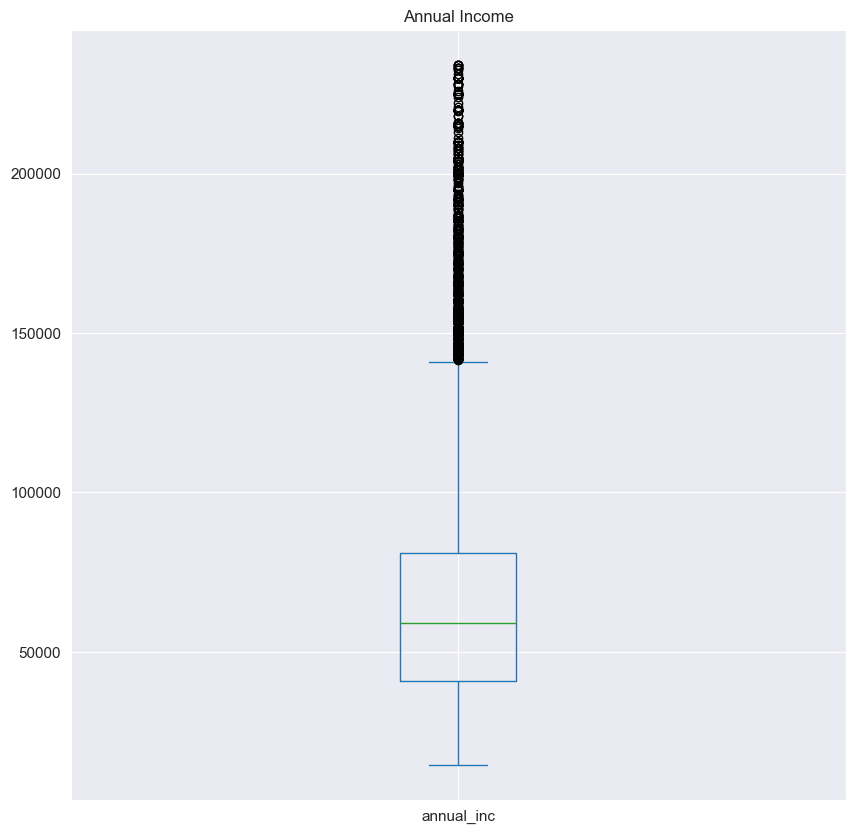

In [113]:
loan_data_df_curated_v2.annual_inc.plot.box(fontsize=11,figsize=(10,10)).set_title('Annual Income')

# Show the plot
plt.show()

Interesting, Now, We can get confused here, Even after removing Outliers we can see extreme end populated still. So, There would always be outliers popping up as we filter the data, doesn't mean we have to remove again and again. This is important for further data analysis.

### Derived Metrics Ideas:  New Variable based on current variables we have.
Let's brainstorm if derived variables that can be created for the further analysis. | Derived Metrics,
1. Loan Amount to Annual income ratio can be created from Loan Amount and Annual Income variables. 
2. Interest Rate's can be grouped ? 
3. Verification Status values some are having same meaning if that can be merged? Source Verified and Verified can be merged. 
4. Annual Income is range, If we categorize it, it would be easy to analyse further.
5. We can create Numeric Variable for Loan Status so, I can use for HeatMap Correlation. Numeric feature would be easier to use in plot. o - Fully Paid, 1 = Default.

Action 1 - Loan Amount to Income Ratio. 

In [114]:
#Calculate Loan to Amount income ratio, New Column will be added. Let's try that. 
loan_data_df_curated_v2["amnt_to_inc_ratio"] = loan_data_df_curated_v2.loan_amnt/loan_data_df_curated_v2.annual_inc *100

In [115]:
loan_data_df_curated_v2.head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,...,addr_state,dti,revol_util,total_pymnt,total_pymnt_inv,total_rec_prncp,last_pymnt_amnt,month,year,amnt_to_inc_ratio
0,5000,5000,4975,36,10.65,162.87,B,B2,10+ years,RENT,...,AZ,27.65,83.7,5863.155187,5833.84,5000.00,171.62,Dec,11,20.833333
1,2500,2500,2500,60,15.27,59.83,C,C4,< 1 year,RENT,...,GA,1.00,9.4,1008.710000,1008.71,456.46,119.66,Dec,11,8.333333
3,10000,10000,10000,36,13.49,339.31,C,C1,10+ years,RENT,...,CA,20.00,21.0,12231.890000,12231.89,10000.00,357.48,Dec,11,20.325203
5,5000,5000,5000,36,7.90,156.46,A,A4,3 years,RENT,...,AZ,11.20,28.3,5632.210000,5632.21,5000.00,161.03,Dec,11,13.888889
6,7000,7000,7000,60,15.96,170.08,C,C5,8 years,RENT,...,NC,23.51,85.6,10110.840000,10110.84,6985.61,1313.76,Dec,11,14.892350


In [116]:
loan_data_df_curated_v2.int_rate.value_counts()

int_rate
10.99    896
11.49    778
7.51     777
13.49    742
7.88     704
        ... 
16.96      1
18.36      1
16.15      1
16.01      1
16.20      1
Name: count, Length: 370, dtype: int64

In [117]:
loan_data_df_curated_v2.int_rate.describe()

count    37772.000000
mean        11.921641
std          3.689180
min          5.420000
25%          8.940000
50%         11.710000
75%         14.350000
max         24.400000
Name: int_rate, dtype: float64

Action 2 - Derived Metrics - Interest Rate Grouping...

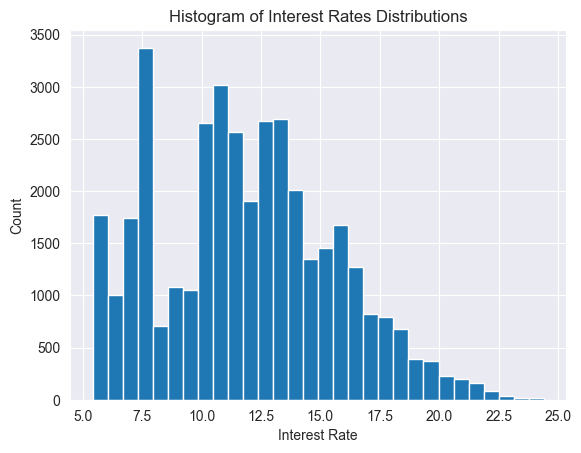

In [118]:
#To do grouping let's see first distribution.
loan_data_df_curated_v2['int_rate'].plot(kind='hist', bins=30, title='Histogram of Interest Rates Distributions',xlabel='Interest Rate',ylabel='Count')
plt.show()

From distribution, It is visible to group of 5 can be created. e.g 0-5,5-10,11-15,16-20,21-25 etc...

Let's Check Interest Rate Distribution in box.

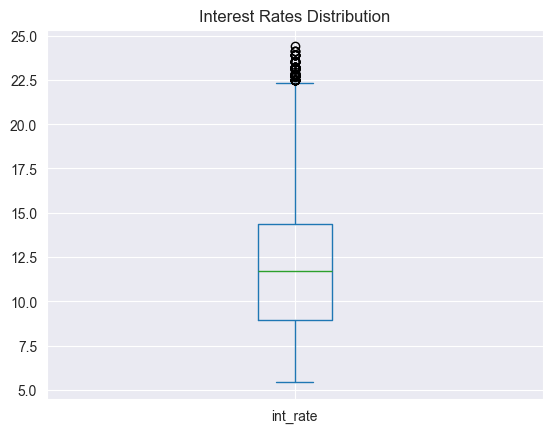

In [119]:
loan_data_df_curated_v2['int_rate'].plot(kind='box', title='Interest Rates Distribution')
plt.show()


In [120]:
#Min 5 and Max 25, So, Let's create 5 bins 
rate_groups_bins = [5,10,15,20,25]
rate_labels_grp = ['5%-10%','10%-15%','15%-20%','20%-25%']

In [121]:
loan_data_df_curated_v2["int_rate_grp"] = pd.cut(loan_data_df_curated_v2['int_rate'], bins=rate_groups_bins, labels=rate_labels_grp)

In [122]:
loan_data_df_curated_v2.int_rate_grp.value_counts()

int_rate_grp
10%-15%    17888
5%-10%     12081
15%-20%     7061
20%-25%      742
Name: count, dtype: int64

Action 3  - Derived Metrics-Merging Verification Status

In [123]:
#Now, Let's take a look at the Verification Status 
loan_data_df_curated_v2.verification_status.value_counts()

verification_status
Not Verified       16387
Verified           11956
Source Verified     9429
Name: count, dtype: int64

In [124]:
#Verified and Source Verified are same So, We can replace one of them to match with Verification. 
loan_data_df_curated_v2["verification_status"] = loan_data_df_curated_v2.verification_status.str.replace('Source Verified','Verified')

In [125]:
loan_data_df_curated_v2.verification_status.value_counts()

verification_status
Verified        21385
Not Verified    16387
Name: count, dtype: int64

Action 4  - Derived Metrics- Annual Income Grouping.
Now, Let's perform on Annual Income and create derived metrics or segmented Variable for that. 

In [126]:
#Let's group Annual Income as well. 
loan_data_df_curated_v2.annual_inc.describe()

count     37772.000000
mean      65906.618633
std       34887.933338
min       14500.000000
25%       40927.000000
50%       59000.000000
75%       81000.000000
max      234000.000000
Name: annual_inc, dtype: float64

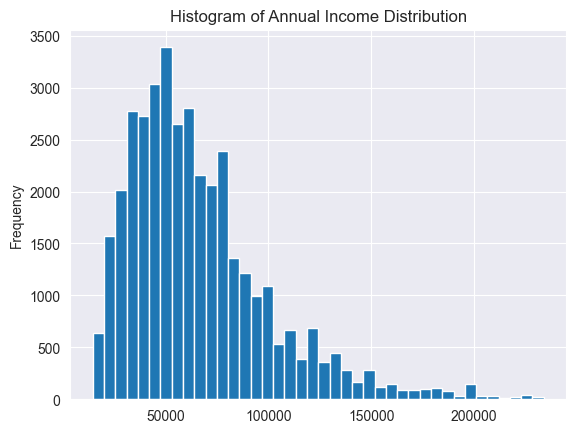

In [127]:
#Taking a view on distribution of Annual Income so we can carefully create groups. 
loan_data_df_curated_v2['annual_inc'].plot(kind='hist', bins=40, title='Histogram of Annual Income Distribution')
plt.show()

In [128]:
#Creating Group (Bins) for the Annual Income. We're taking the lowest value and till the highest value, Taking the help from above describe() result for Min and Max 
annual_inc_group = [14400,25000,50000,100000,150000,200000,234000]
annual_inc_labels = ['14K-25K','25K-50K','50K-100K','100K-150K','150K-200K','200K-250K']

In [129]:
#Now, Let's put this into the new column called "annual_inc_group" 
loan_data_df_curated_v2['annual_inc_group'] = pd.cut(loan_data_df_curated_v2['annual_inc'], bins=annual_inc_group,
                               labels=annual_inc_labels)
loan_data_df_curated_v2['annual_inc_group'].value_counts()

annual_inc_group
50K-100K     17706
25K-50K      12840
100K-150K     3995
14K-25K       2131
150K-200K      916
200K-250K      184
Name: count, dtype: int64

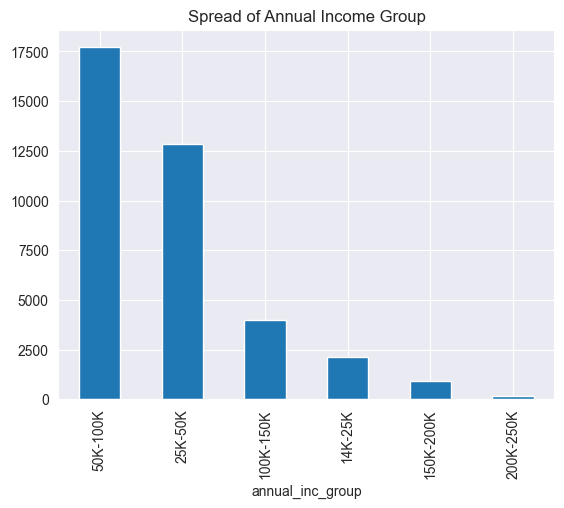

In [130]:
#Now, Let's take a look at the spread of Annual Income Group.
loan_data_df_curated_v2['annual_inc_group'].value_counts().plot(kind='bar', title='Spread of Annual Income Group')
plt.show()

Observation - From this we can see, The highest loan is issued to the income group 50K-100K USD.

Action 5 - Create loan_status_indicator with 0 and 1 value. O = Fully Paid, 1 = Charged Off.

In [131]:
#Let's create the dictionary to this value and create new column in data frame.
loan_status_indicator_dict = {'Charged Off': 1, 'Fully Paid': 0}
loan_data_df_curated_v2["loan_status_indicator"] = loan_data_df_curated_v2["loan_status"].replace(loan_status_indicator_dict)
loan_data_df_curated_v2[ ["loan_status_indicator","loan_status"]].head()

,loan_status_indicator,loan_status
0,0,Fully Paid
1,1,Charged Off
3,0,Fully Paid
5,0,Fully Paid
6,0,Fully Paid


In [132]:
loan_data_df_curated_v2.loan_status_indicator.value_counts()

loan_status_indicator
0    32292
1     5480
Name: count, dtype: int64

## Now, Let's Explore EDA ( Univariate Analysis, Segmented Univariate Analysis, Bivariate Analysis, Multivariate Analysis)

## Univariate Analysis And Steps That I want to Follow:
1. Segregation of Facts and Dimensions. (Categorical Variable and Numerical (Quantative) variables) 
2. Ordered Categorical Variables 
3. Unordered Categorical Variables 
4. Quantitative/Numeric Variables 



Let's Identify Step 1 first which is to segregate Facts and Dimensions Variables. 

In [133]:
loan_data_df_curated_v2.dtypes

loan_amnt                   int64
funded_amnt                 int64
funded_amnt_inv             int64
term                        int64
int_rate                  float64
installment               float64
grade                      object
sub_grade                  object
emp_length                 object
home_ownership             object
annual_inc                  int64
verification_status        object
issue_d                    object
loan_status                object
purpose                    object
addr_state                 object
dti                       float64
revol_util                float64
total_pymnt               float64
total_pymnt_inv           float64
total_rec_prncp           float64
last_pymnt_amnt           float64
month                      object
year                       object
amnt_to_inc_ratio         float64
int_rate_grp             category
annual_inc_group         category
loan_status_indicator       int64
dtype: object

In [134]:
# Let's Put all the numeric features (We'll call them features instead of Columns) into one variable. 
numerical_features = loan_data_df_curated_v2.dtypes[loan_data_df_curated_v2.dtypes != 'object']
numerical_features

loan_amnt                   int64
funded_amnt                 int64
funded_amnt_inv             int64
term                        int64
int_rate                  float64
installment               float64
annual_inc                  int64
dti                       float64
revol_util                float64
total_pymnt               float64
total_pymnt_inv           float64
total_rec_prncp           float64
last_pymnt_amnt           float64
amnt_to_inc_ratio         float64
int_rate_grp             category
annual_inc_group         category
loan_status_indicator       int64
dtype: object

In [135]:
# Let's Put all the Categorical features (We'll call them features instead of columns) into one variable. 

categorical_features = loan_data_df_curated_v2.dtypes[loan_data_df_curated_v2.dtypes == 'object']
categorical_features

grade                  object
sub_grade              object
emp_length             object
home_ownership         object
verification_status    object
issue_d                object
loan_status            object
purpose                object
addr_state             object
month                  object
year                   object
dtype: object

In [136]:
#We can check all the numerical Features Describe() together and high level view on it. 
loan_data_df_curated_v2[numerical_features.index.tolist()].describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
loan_amnt,37772.0,NaN,NaN,NaN,11049.056179,7256.864451,500.0,5500.0,9800.0,15000.0,35000.0
funded_amnt,37772.0,NaN,NaN,NaN,10787.257095,7001.742538,500.0,5400.0,9600.0,15000.0,35000.0
funded_amnt_inv,37772.0,NaN,NaN,NaN,10225.806497,6938.340237,0.0,5000.0,8800.0,14000.0,35000.0
term,37772.0,NaN,NaN,NaN,41.924388,10.348419,36.0,36.0,36.0,36.0,60.0
int_rate,37772.0,NaN,NaN,NaN,11.921641,3.68918,5.42,8.94,11.71,14.35,24.4
installment,37772.0,NaN,NaN,NaN,322.385894,205.679858,15.69,167.63,278.85,424.6025,1305.19
annual_inc,37772.0,NaN,NaN,NaN,65906.618633,34887.933338,14500.0,40927.0,59000.0,81000.0,234000.0
dti,37772.0,NaN,NaN,NaN,13.362028,6.651615,0.0,8.25,13.47,18.62,29.99
revol_util,37772.0,NaN,NaN,NaN,48.796386,28.298071,0.0,25.4,49.2,72.3,99.9
total_pymnt,37772.0,NaN,NaN,NaN,11863.055644,8693.611994,0.0,5569.718369,9726.476414,16083.657482,58563.67993


In [137]:
#We can check all the Categorical Features Describe() together and high level view on it. 
loan_data_df_curated_v2[categorical_features.index.tolist()].describe(include='all').T

,count,unique,top,freq
grade,37772,7,B,11443
sub_grade,37772,35,A4,2825
emp_length,37772,12,10+ years,8342
home_ownership,37772,5,RENT,18076
verification_status,37772,2,Verified,21385
issue_d,37772,55,Nov-11,2025
loan_status,37772,2,Fully Paid,32292
purpose,37772,14,debt_consolidation,17769
addr_state,37772,50,CA,6806
month,37772,12,Dec,4143


Let's Start Univariate Analysis : Categorical Variables. 

Identify Ordered Categorical Variables and Unordered Categorical Variables 
Identify Quantitative Variables 

Ordered Categorical Variables
1. Grad has 7 unique values and its has the value as its order matters A, B etc... 
2. Same Applies for Sub Grade 
3. month - This would be in order, total numbers would be 1 to 12 
4. year - This is also order data 
5. Emp Length Group 
6. Term
7. Interest Rate Group
8. Annual Income Group

Unorder Categorical Variables
1. home_ownership
2. Verification Status 
3. Address State
4. Purpose 

Quantitative Variables 
1. Loan Amount 
2. Fund Amount 
3. Fund Investor Amount 
5. Installment
6. revol_util ratio 
7. Total Payment 
8. Loan Amount to Annual Income Ratio 
9. Year 

In [138]:
# As we know, Unordered Categorical Variables, We can go by Count / Frequency Plot. Which is called Rank of distributions. Rank vs Frequency as per the module example given in the lecture. 
#Count or Bar Plot would be helpful

In [139]:
#Calculating Count by Category and then will use it to call plot.  

# Count the occurrences of each category
home_ownership_counts = loan_data_df_curated_v2['home_ownership'].value_counts()

# Verification and Loan Status has only 2 unique values so, it can be different chart. 
verif_counts = loan_data_df_curated_v2['verification_status'].value_counts()
loanStatus_counts = loan_data_df_curated_v2['loan_status'].value_counts()

purpose_counts = loan_data_df_curated_v2['purpose'].value_counts()
addr_state_counts = loan_data_df_curated_v2['addr_state'].value_counts()


In [140]:
#Defination of Bar Plot which accepts Feature Count List and Feature Name to put in the plot.
#This can be used for Univariate analysis.
def drawBarPlot (features_count, feature_name,displayPercent):
    
    plt.figure(figsize=(10, 6), dpi=300)
    
    sns.set(style="whitegrid")
    ax = sns.barplot(x=features_count.index, y=features_count.values)
    
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    
    # Set the labels and title
    plt.xlabel(feature_name)
    plt.ylabel('Count of Loan Applicants')
    plt.title('Univariate  analysis of ' + feature_name)
    
    #Annotate each bar with the count
    if displayPercent == 0:
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}',
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha = 'center',
                        va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points',rotation = 90)

    total = sum(p.get_height() for p in ax.patches)

    # Annotate each bar with the %
    if displayPercent == 1:
        for p in ax.patches:
            percentage = f'{100 * p.get_height() / total:.1f}%'
            ax.annotate(percentage,
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha = 'center',
                        va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points',
                        rotation = 45)
    
    # Show the plot
    plt.show()

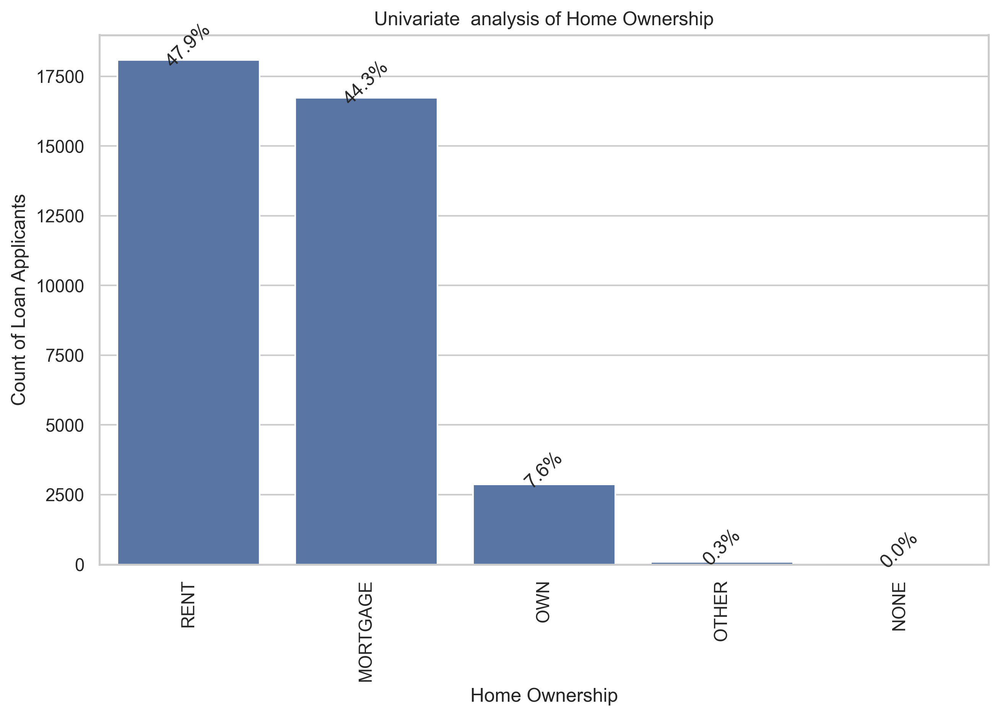

In [141]:
#1. Unordered Categorical Variable - Home Ownership Frequency. 
drawBarPlot(home_ownership_counts,'Home Ownership',1)

We can see Rent and Mortgage are the primary values who are availing more loans. 

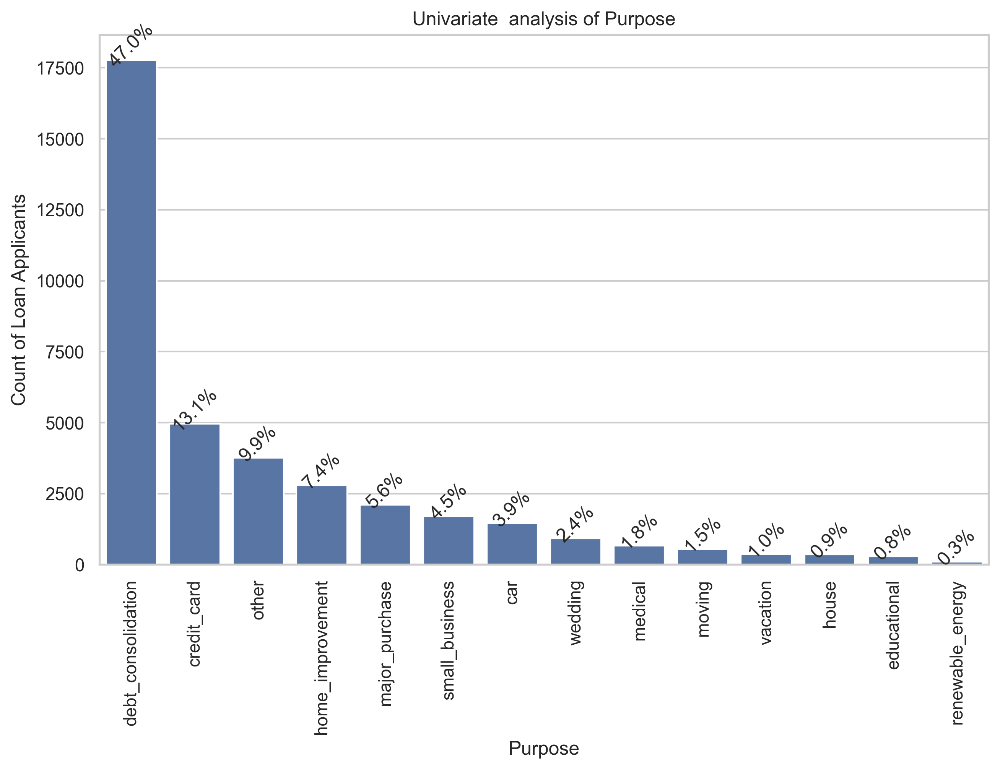

In [142]:
#2 - Purpose - Unordered Categorical Variable 
drawBarPlot(purpose_counts,'Purpose',1)

We can see The Majority of the purpose to take the loans are debt_consolidations and to pay Credit_card bill then for other purposes. 

<Figure size 1600x800 with 0 Axes>

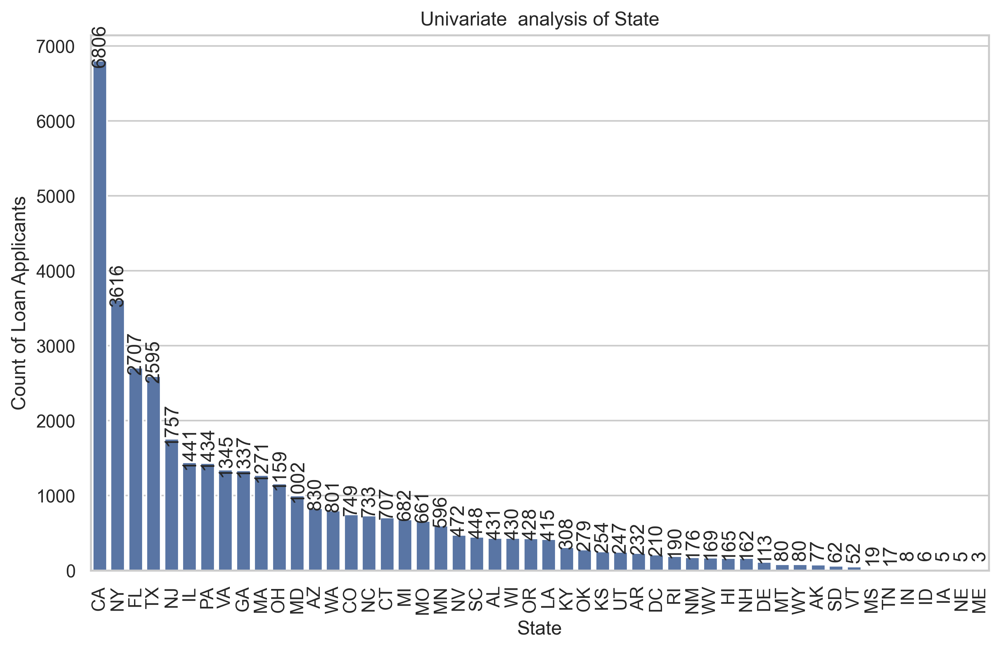

In [143]:
#3 - State Unordered Categorical Variable. 
plt.figure(figsize=(16, 8))
drawBarPlot(addr_state_counts,'State',0)
plt.show()

CA, NY and FL are top 3 states where loan has been issued more number of times than rest of the other states.

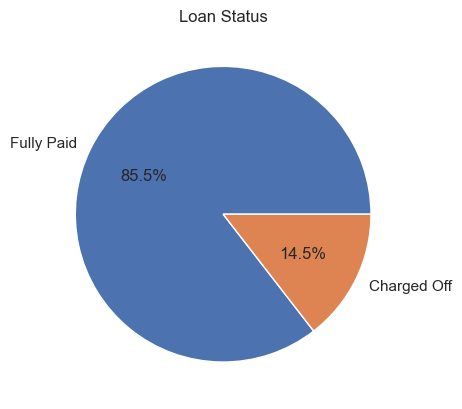

In [144]:
#4 - Loan Status - Categorical Variable - Output Parameter. 
plt.pie(loanStatus_counts,labels=['Fully Paid','Charged Off'],autopct='%1.1f%%')
plt.title("Loan Status")
plt.show()

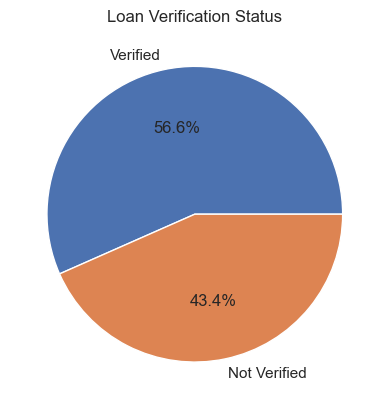

In [145]:
#5 - Verification Counts - Unordered Categorical Variable 
plt.pie(verif_counts,labels=['Verified','Not Verified'],autopct='%1.1f%%')
plt.title("Loan Verification Status")
plt.show()

In [146]:
verif_counts

verification_status
Verified        21385
Not Verified    16387
Name: count, dtype: int64

##### Summarising > Time to Note down the analysis for Un-order Categorical Variables done above
1. 57% of Loans are verified and 43% are not verified. 
2. State CA = California has the highest number of loan given. NY and FL followed second and 3rd. 
3. 14.5% loans are charged off, Defaulted. 
4. Debt_Consolidation has been the top purpose of loans that are issued. Then "Credit card" and for "other" purpose. 
5. Rented and Mortgage is the top category of people who has availed maximum loans. 

##### Let's Evaluate **Ordered** Categorical Variables Now....
1. Grad has 7 unique values and its has the value as its order matters A, B etc... 
2. Same Applies for Sub Grade 
3. month - This would be in order, total numbers would be 1 to 12 
4. year - This is also order data

In [147]:
#Reusable function to draw count plot. 
def drawCountPlot(df,orderofFeature,feature_name,displayPercent):

    # Create the count plot
    ax = sns.countplot(x=df,order=orderofFeature)

    #annote numbers on top of the bar.
    if displayPercent == 0:
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                        textcoords='offset points',rotation=90)

    #annote % on the bar.
    total = sum(p.get_height() for p in ax.patches)

    if displayPercent == 1:
        for p in ax.patches:
            percentage = f'{100 * p.get_height() / total:.1f}%'
            ax.annotate(percentage,
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha = 'center',
                        va = 'center',
                        xytext = (0, 9),
                        textcoords = 'offset points', rotation = 45)

    # Add labels and title
    plt.xlabel(feature_name)
    plt.ylabel('Count of Loan Issued')
    plt.title('Univariate analysis on ' + feature_name)
    
    # Show the plot
    plt.show()

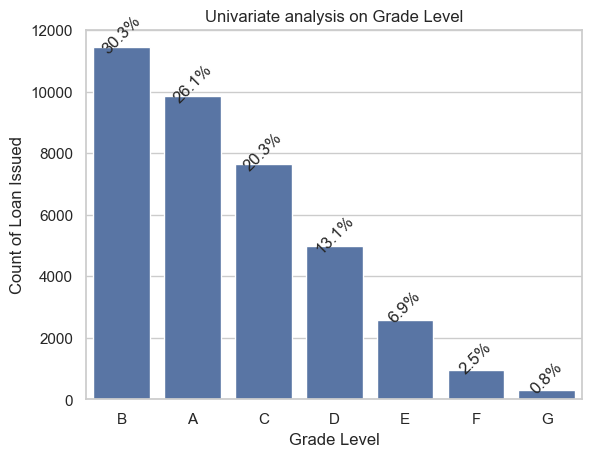

In [148]:
#1 - Grade - Ordered Categorical Variable. 
drawCountPlot(loan_data_df_curated_v2.grade,loan_data_df_curated_v2.grade.value_counts().index,'Grade Level',1)

Grade B, A, C got the more loans issued. 

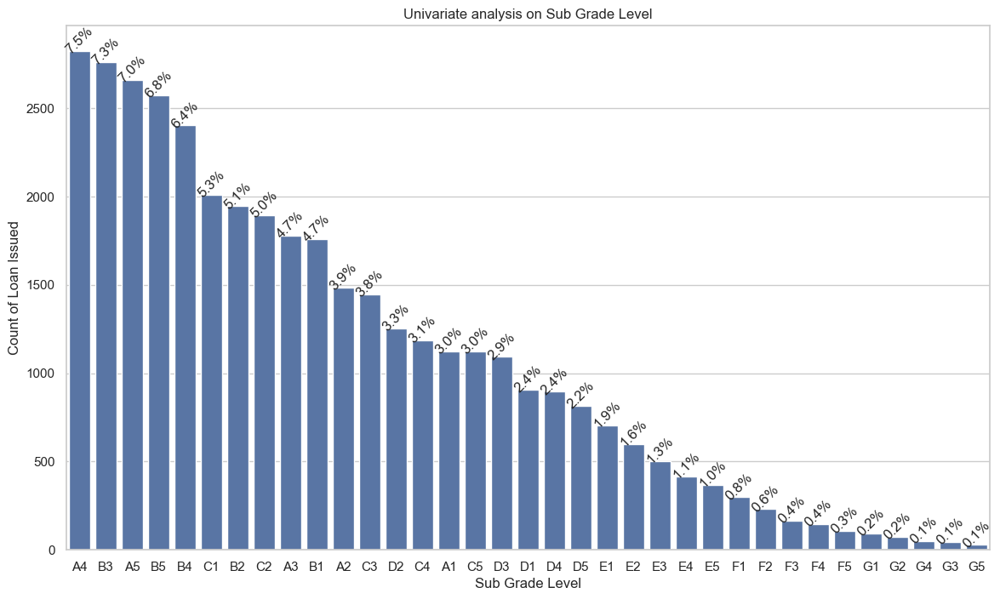

In [149]:
#2 - Subgrade - Ordered Categorical Variable. 
plt.figure(figsize=(14, 8))
drawCountPlot(loan_data_df_curated_v2.sub_grade,loan_data_df_curated_v2.sub_grade.value_counts().index,'Sub Grade Level',1)

A4,B3, A5, B5 are top subgrade which received more loans. Lending club issued more loans to these sub grades. 

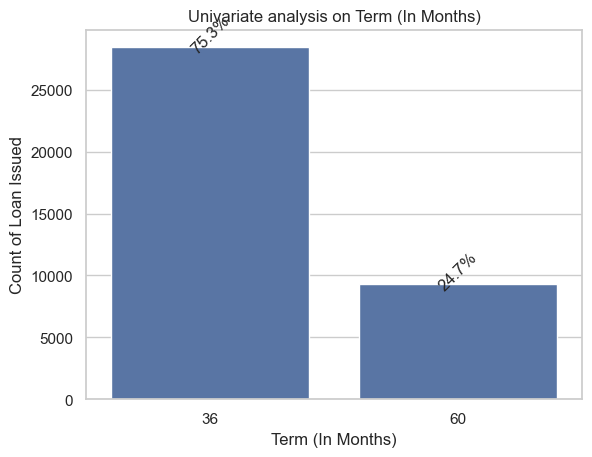

In [150]:
#3 - Term - Numeric Variable as we removed Months label from it. It was Categorical Variable, but We can take a look at here as well. 
drawCountPlot(loan_data_df_curated_v2.term,loan_data_df_curated_v2.term.value_counts().index,'Term (In Months)',1)

We can see, Lending Club has issued more number of loans for the term of 36 months. 

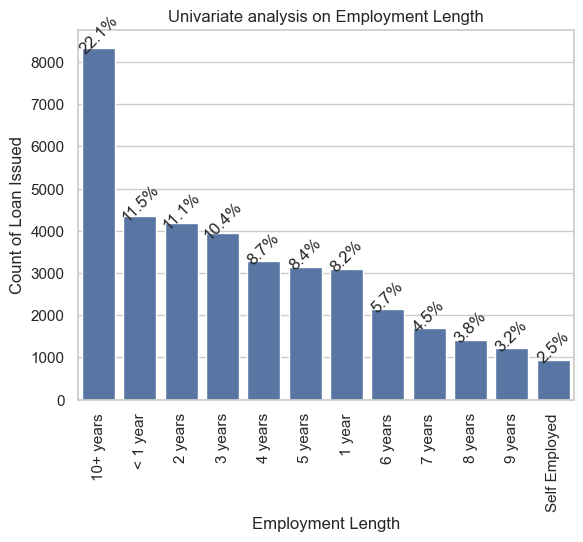

In [151]:
#4 - Employment Length - Ordered Categorical Variable. 
plt.xticks(rotation=90)
drawCountPlot(loan_data_df_curated_v2.emp_length,loan_data_df_curated_v2.emp_length.value_counts().index,'Employment Length',1)

We can see, More number of loans are taken by the people who are employed more than 10 years. 

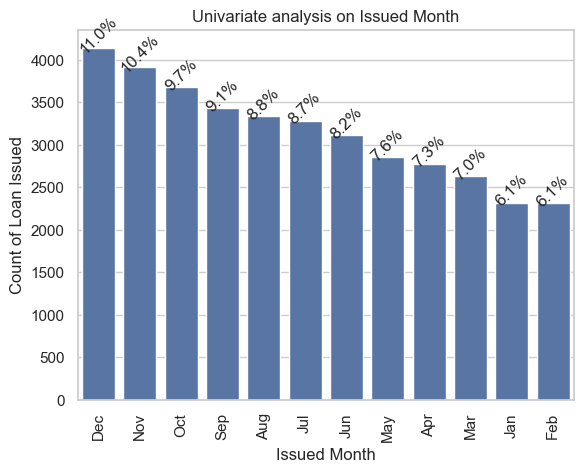

In [152]:
#5 - Issued Month - Ordered Categorical Variable. 
plt.xticks(rotation=90)
drawCountPlot(loan_data_df_curated_v2.month,loan_data_df_curated_v2.month.value_counts().index,'Issued Month',1)

More number of loans are issued in the month of Dec, Nov, Oct and least number of loans are issued in beginning of the years.

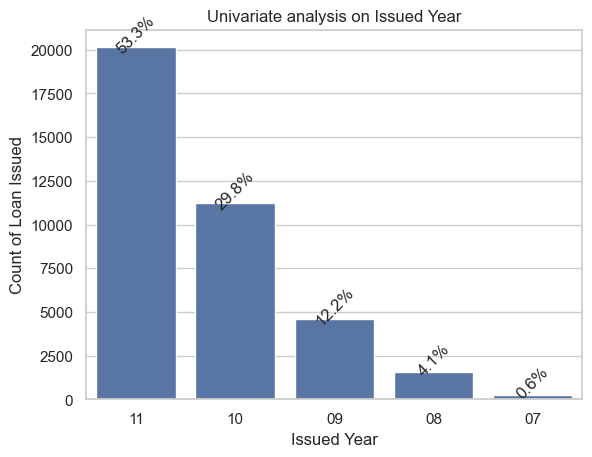

In [153]:
#6 - Ordered Variable - Numeric - 
drawCountPlot(loan_data_df_curated_v2.year,loan_data_df_curated_v2.year.value_counts().index,'Issued Year',1)

#### Let's put the analysis for Ordered Categorical Variables. 
1. Maximum loan issued in the Year 2011 - 53%
2. Maximum loan are issued in end of the year specially in the month of December, November and October. 
3. Employment length shows, people with 10+ years has taken maximum times loan and loan is issued them is highest in the number. 22% it is.
4. We can see maximum loan is issued for 36 months compare to 60 months term. 
5. Grade B has given the highest loan then A and then C
6. Also, We can see A4, B3, A5 are top sub grade who got the highest number of times loan. 

### Now, Let's try to get into Quantitative Univariate Variables Analysis.


Quantitative / Numeric Variables 
1. Loan Amount 
2. Fund Amount 
3. Fund Investor Amount
4. Installment 
5. revol_util ratio 
6. Total Payment 
7. Loan Amount to Annual Income Ratio 
8. Year - This was covered above though 
9. Term - This was covered above though. 

In [154]:
#Function to draw histogram along with Boxplot for Numeric Variables. 
def draw_subplots(data,feature_name):
 

    # Create a figure with three subplots in one row
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))
    
    # Distribution plot (Histogram)
    sns.histplot(data, kde=True, ax=axs[0])
    axs[0].set_title('Distribution Plot of ' + feature_name)
    axs[0].set_xlabel(feature_name)
    axs[0].set_ylabel('Loan Issued Count')
    
    # Box plot
    sns.boxplot(x=data, ax=axs[1],showmeans=True)
    axs[1].set_title('Box Plot of ' + feature_name)
    axs[1].set_xlabel(feature_name)
    
    # Adjust the layout
    plt.tight_layout()
    
    # Show the plots
    plt.show()

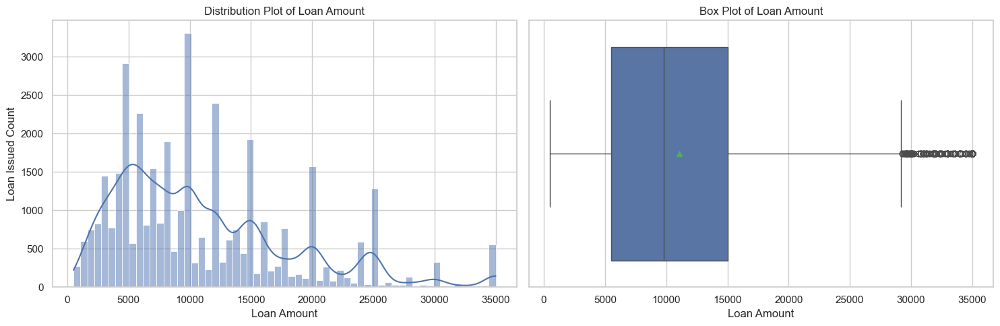

In [155]:
#1 - Loan Amount Numeric Variable - Continuous Variable. 
draw_subplots(loan_data_df_curated_v2.loan_amnt,'Loan Amount')

5K-15K is the concentrated area for which loan is issued more. 10K is the mean. 

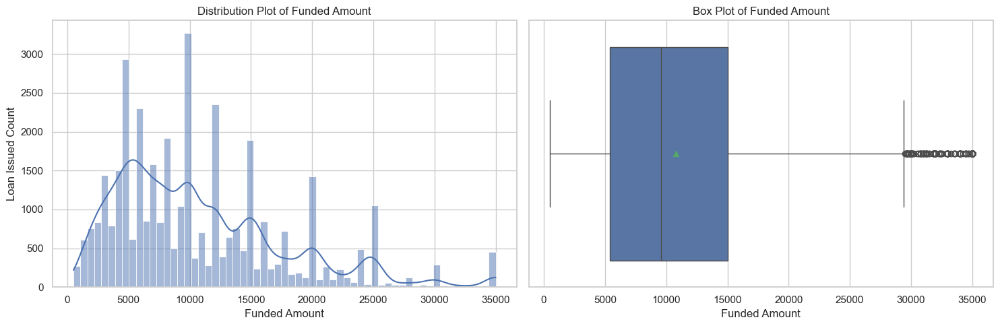

In [156]:
#2. Funded Amount - Numeric Variable - Continuous Variable. 
draw_subplots(loan_data_df_curated_v2.funded_amnt,'Funded Amount')

Looks like Funded Amount is same as Loan Amount. 

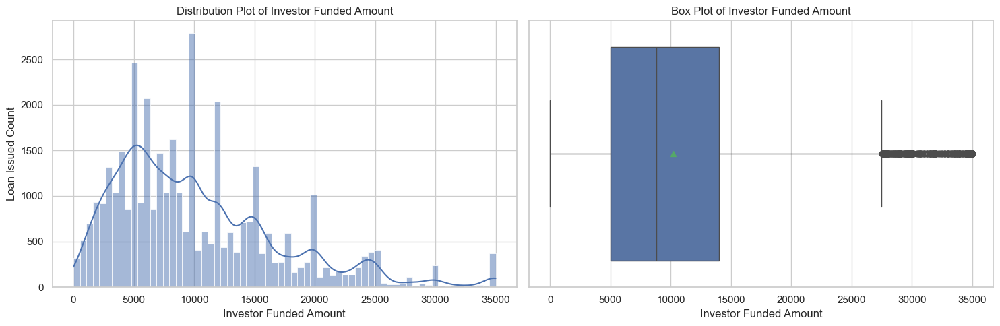

In [157]:
#3 - Investor Funded Amount - Continuous Variable again. 
draw_subplots(loan_data_df_curated_v2.funded_amnt_inv,'Investor Funded Amount')

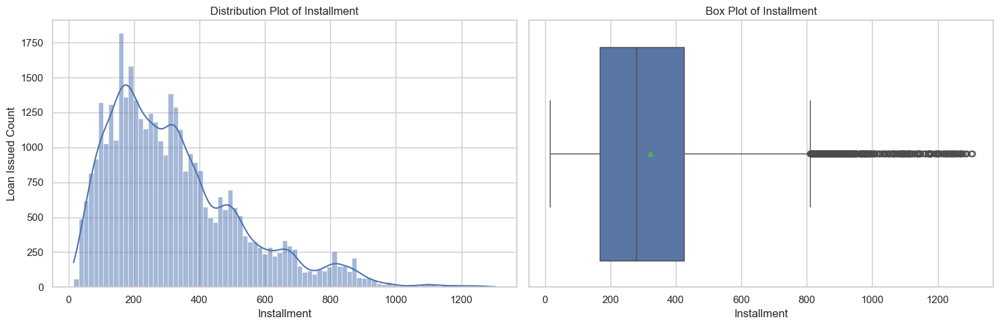

In [158]:
#4 - Installment Amount - Continuous Variable. 
draw_subplots(loan_data_df_curated_v2.installment,'Installment')


Average Installment amount is 200 to 400 USD. 

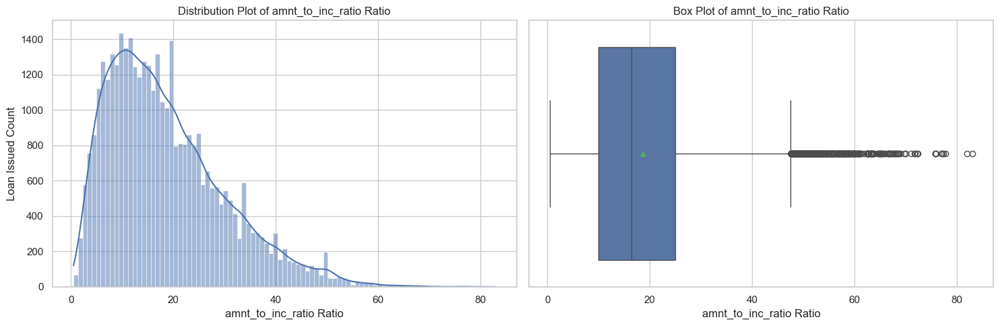

In [159]:
#5 - Amount to Income Ration - Continuous Variable. 
draw_subplots(loan_data_df_curated_v2.amnt_to_inc_ratio,'amnt_to_inc_ratio Ratio')

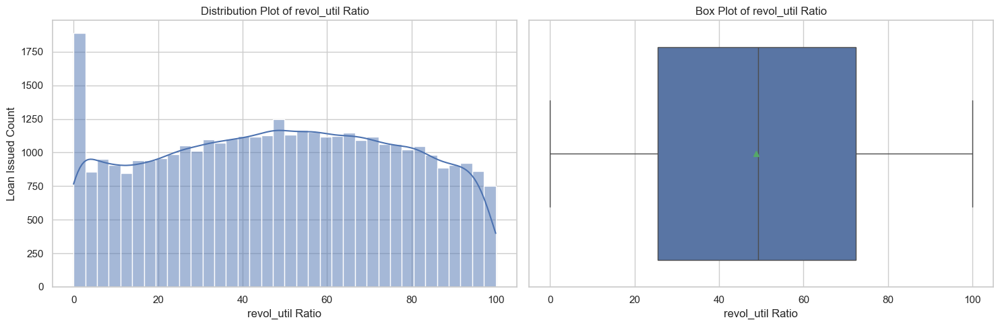

In [160]:
#6- revol_util ratio - this is to check Credit worthiness.
draw_subplots(loan_data_df_curated_v2.revol_util,'revol_util Ratio')

Amount to Income Ratio per definitation lower the better, and it looks like mean is lower than 20 which is good sign. 

In [161]:
loan_data_df_curated_v2.amnt_to_inc_ratio.describe()

count    37772.000000
mean        18.619623
std         11.444072
min          0.500000
25%          9.999200
50%         16.379007
75%         25.000000
max         83.000000
Name: amnt_to_inc_ratio, dtype: float64

### Let's summarise the analysis for this Single Quantitative variables 
1. Loan Amount to Income Ratio is Concentrated on lower side, and Mean is 18% which is suggesting overall good nature.
2. Installment Amount Avg Concentrated around 200 to 400 USD
3. Loan Amount and Funded Amount is almost same, and Loan Amount range is 5000 to 15000 USD.
4. 53% loans are issued in the year 2011 whereas only 0.6% in the year 2007. 30% in 2010.
5. Year-end months are commonly highest % of loans are issued. 11% , 10.4%, 9.7% are for Dec, Nov, Oct respectively.
6. Revol_util ratio is concentrated in the range 22 - 70%

### Let us perform Segmented Univariate Analysis on Interest Rate Group and Income Group. 

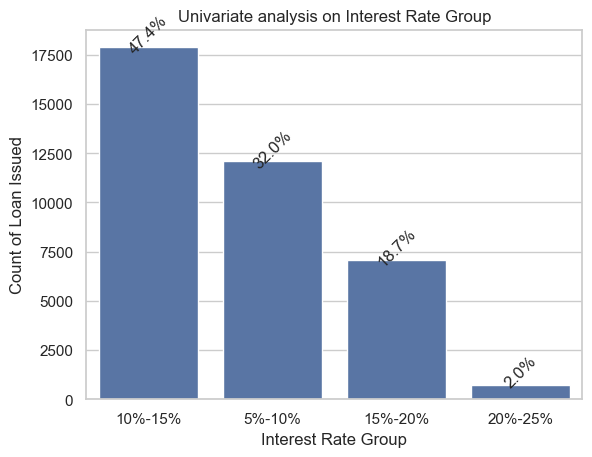

In [162]:
#1 - Interest Rate Group - Segmented Variable Analysis 
drawCountPlot(loan_data_df_curated_v2.int_rate_grp,loan_data_df_curated_v2.int_rate_grp.value_counts().index,'Interest Rate Group',1)

10-15% rate of interest is the highiest number of times loans are issued.  

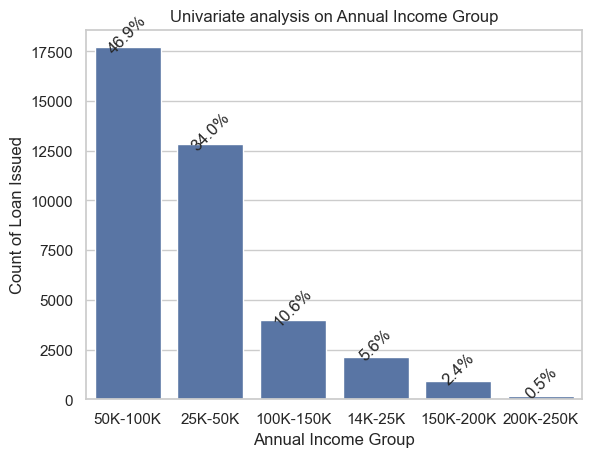

In [163]:
#2 - Annual Income Group - Segmented Univariate Analysis 
drawCountPlot(loan_data_df_curated_v2.annual_inc_group,loan_data_df_curated_v2.annual_inc_group.value_counts().index,'Annual Income Group',1)

### Let's summarise Analysis on Segmented Univariate variable: 
1. Income ranging between 50K-100K USD are given the highest loan 
2. 10-15% Interest rate is there for maximum loans, lowest loans issued on 20-25%  

### Let us put down all the Univariate Analysis together here: 
**********
### Unordered Categorical Variable
1. 57% of Loans are verified and 43% are not verified. 
2. State CA = California has the highest number of loan given. NY and FL followed second and 3rd. 
3. 14.5% loans are charged off, Defaulted. 
4. Debt_Consolidation has been the top purpose of loans that are issued. Then "Credit card" and for "other" purpose. 
5. Rented and Mortgage is the top category of people who has availed maximum loans. 

### Ordered Categorical Variable. 
1. 53% loan issued in the Year 2011
2. Maximum loan are issued in end of the year especially in the month of December, November and October.
3. Employment length shows, people with 10+ years has taken 22% loan and loan is issued them is highest in the number.
4. We can see maximum loan is issued for 36 months compare to 60 months term.
5. Grade B has given the highest loan then A and then C ( 30%, 26% and 20%)
6. Also, We can see A4, B3, A5 are top sub_grade who got the highest number of times loan.


### Quantitative, Numeric Continuous Variable Analysis 
1. Loan Amount to Income Ratio is Concentrated on lower side, and Mean is 18% which is suggesting overall good nature.
2. Installment Amount Avg Concentrated around 200 to 400 USD
3. Loan Amount and Funded Amount is almost same, and Loan Amount range is 5000 to 15000 USD.
4. 53% loans are issued in the year 2011 whereas only 0.6% in the year 2007. 30% in 2010.
5. Year-end months are commonly highest % of loans are issued. 11% , 10.4%, 9.7% are for Dec, Nov, Oct respectively.


#### Segmented Univariate Analysis 
1. Income ranging between 50K-100K USD are given the highest loan
2. 10-15% Interest rate is there for maximum loans, lowest loans issued on 20-25%  

**********

#### Let's Start Bivariate Analysis - Two or more variable analysis together. 

We will check now, Loan Status as target output variable against all over univariate variables. So, One variable which we want to keep fix is Loan Status. 
Now, Let's break down this analysis in some logical way, so it become easier to understand. 

Logical way of doing is keeping the same order of above univariate variables with Loan Status.  

Loan Status is the main target variable to denote what happened to that raw. 

Categorical Variable vs Loan Status 
Numeric variables vs Loan Status 



1. Grade vs Loan Status 
2. Subrade vs Loan Status 
3. Term vs Loan Status 
4. Employment Length vs Loan Status 
5. Loan Issue Month, Year vs Loan Status 
6. Purpose vs Loan Status 
7. Home_Ownership vs Loan Status 
8. Verification Status vs Loan Status 
9. State Vs Loan Status 

Numeric Variables  
1. Loan Amount vs Loan Status
2. Interest Rate Group vs Loan Status 
3. Year vs Loan Status 
4. Loan Amount to Income Ratio vs Loan Status 
5. Revolving Credit vs Loan Status 
6. dti vs Loan Status ( dti - A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.)

In [164]:
categorical_features.index.tolist()

['grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'issue_d',
 'loan_status',
 'purpose',
 'addr_state',
 'month',
 'year']

In [165]:
#Just Printed to see columns that we want to evaluate 
loan_data_df_curated_v2.select_dtypes(include=['number']).columns.tolist()

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'term',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'revol_util',
 'total_pymnt',
 'total_pymnt_inv',
 'total_rec_prncp',
 'last_pymnt_amnt',
 'amnt_to_inc_ratio',
 'loan_status_indicator']

In [166]:
numerical_features = loan_data_df_curated_v2.select_dtypes(exclude=['object', 'category']).columns.tolist()
loan_data_df_curated_v2[numerical_features].head()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,annual_inc,dti,revol_util,total_pymnt,total_pymnt_inv,total_rec_prncp,last_pymnt_amnt,amnt_to_inc_ratio,loan_status_indicator
0,5000,5000,4975,36,10.65,162.87,24000,27.65,83.7,5863.155187,5833.84,5000.00,171.62,20.833333,0
1,2500,2500,2500,60,15.27,59.83,30000,1.00,9.4,1008.710000,1008.71,456.46,119.66,8.333333,1
3,10000,10000,10000,36,13.49,339.31,49200,20.00,21.0,12231.890000,12231.89,10000.00,357.48,20.325203,0
5,5000,5000,5000,36,7.90,156.46,36000,11.20,28.3,5632.210000,5632.21,5000.00,161.03,13.888889,0
6,7000,7000,7000,60,15.96,170.08,47004,23.51,85.6,10110.840000,10110.84,6985.61,1313.76,14.892350,0


Bivariate Analysis on Continous Variables 
- Pairs of Continous Variables (Correlation -1,0,1),
    - If One Increase as other increase then correlation is +ve - Same Direction 
    - If one decrease as other increase then correlation is -ve - Opposite Direction 
    - If one stays constant as other changes the correlation is 0. 
- Bivariate Analysis on Categorical Variables (Categorical and Continous Variable) 
    - To see distribution of two Categorical Variable
    - To see distribution of two Categorical Variable with one Continous variable 


Categorical Variable
- Grade
- Sub_grade
- Emp_length
- Home_ownership
- Verification_status
- Issue_d
- Loan_status
- Purpose
- Addr_state
- Month


Numerical Variable
- Loan_amnt
- Funded_amnt
- Funded_amnt_inv
- Term
- Int_rate
- Installment
- Annual_inc
- Dti
- Revol_util
- Total_pymnt
- Total_pymnt_inv
- Total_rec_prncp
- Last_pymnt_amnt
- Amnt_to_inc_ratio
- Loan_status_indicator
- year


In [167]:
#Let's check correlation between variables.
loan_data_df_curated_v2[numerical_features].corr()

,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,annual_inc,dti,revol_util,total_pymnt,total_pymnt_inv,total_rec_prncp,last_pymnt_amnt,amnt_to_inc_ratio,loan_status_indicator
loan_amnt,1.000000,0.981566,0.936772,0.348567,0.300877,0.930853,0.404736,0.069165,0.061370,0.879159,0.844292,0.841775,0.471018,0.642847,0.065882
funded_amnt,0.981566,1.000000,0.955259,0.326766,0.305140,0.957031,0.400312,0.068737,0.065227,0.896134,0.861337,0.860126,0.475251,0.630299,0.062901
funded_amnt_inv,0.936772,0.955259,1.000000,0.345939,0.297433,0.903344,0.382997,0.076884,0.070137,0.871722,0.906954,0.834303,0.466235,0.597860,0.043540
term,0.348567,0.326766,0.345939,1.000000,0.440508,0.089081,0.069195,0.076984,0.064729,0.305936,0.321468,0.199208,0.269725,0.288179,0.176482
int_rate,0.300877,0.305140,0.297433,0.440508,1.000000,0.277271,0.066125,0.115697,0.468023,0.289607,0.283784,0.172218,0.171546,0.219888,0.213909
installment,0.930853,0.957031,0.903344,0.089081,0.277271,1.000000,0.402249,0.058984,0.092055,0.855399,0.813818,0.843757,0.409326,0.582518,0.032639
annual_inc,0.404736,0.400312,0.382997,0.069195,0.066125,0.402249,1.000000,-0.116739,0.034096,0.385358,0.370638,0.386133,0.219116,-0.306201,-0.060894
dti,0.069165,0.068737,0.076884,0.076984,0.115697,0.058984,-0.116739,1.000000,0.279378,0.065820,0.072598,0.042837,0.012661,0.145636,0.045270
revol_util,0.061370,0.065227,0.070137,0.064729,0.468023,0.092055,0.034096,0.279378,1.000000,0.071632,0.075183,0.018922,-0.017402,0.035215,0.101328
total_pymnt,0.879159,0.896134,0.871722,0.305936,0.289607,0.855399,0.385358,0.065820,0.071632,1.000000,0.967884,0.973120,0.509551,0.536692,-0.235451


In [168]:
def bivariateCategorical_NumericalPlot(xData,yData,title,xLabel,yLabel):
    sns.barplot(x=loan_data_df_curated_v2['int_rate_grp'], y=loan_data_df_curated_v2['amnt_to_inc_ratio'])
    sns.barplot(x=xData, y=yData)
    # Set the title and labels
    plt.title(' Bivariate ' + title)
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)

    plt.show()

In [169]:
#This is used to see different color palate available.
#plt.colormaps()

## Let's Perform Bivariate Analysis

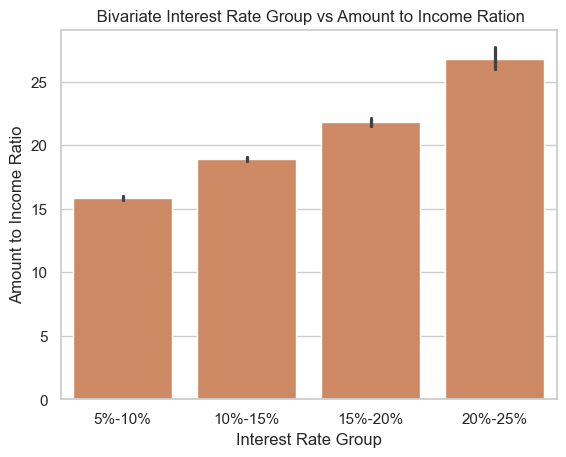

In [170]:
#Bivariate Analysis
bivariateCategorical_NumericalPlot(loan_data_df_curated_v2['int_rate_grp'],loan_data_df_curated_v2['amnt_to_inc_ratio'],'Interest Rate Group vs Amount to Income Ration','Interest Rate Group','Amount to Income Ratio')

In [171]:
#Bivariate Analysis Categorical and Numerical Variable Combinations.
def plotBoxForBivariate(onX,onY,data,hue,xLabel,yLabel,PlotTitle):
    # Create a boxplot to Compare Numerical Variables and Categorical Variables.
    sns.boxplot(x=onX
                , y=onY, data=data, hue=hue)
    
    # Set the labels and title
    plt.xlabel(xLabel)
    plt.ylabel(yLabel)
    plt.title(PlotTitle)
    
    # Display the plot
    plt.show()

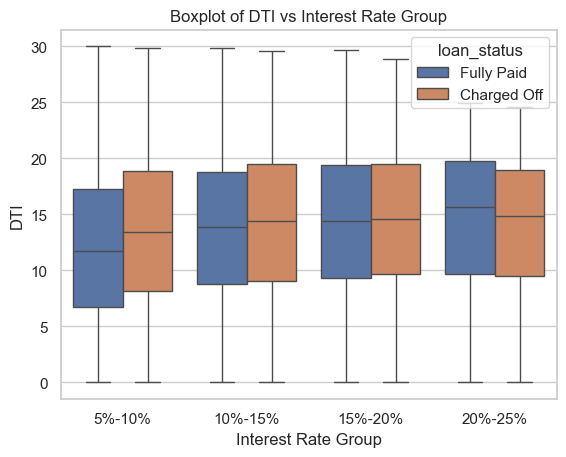

In [172]:
#1. DTI vs Interest Rate Group
# Create a boxplot to Compare Numerical Variables and Categorical Variables.
# A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.
plotBoxForBivariate('int_rate_grp','dti',loan_data_df_curated_v2,'loan_status','Interest Rate Group','DTI','Boxplot of DTI vs Interest Rate Group')

DTI ratio is almost similar across the Interest Rate Group.

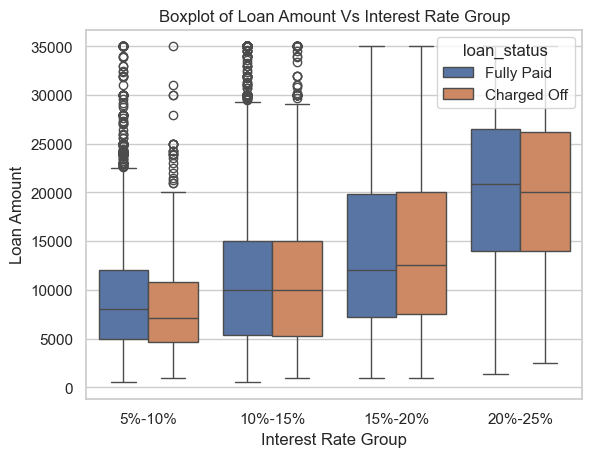

In [173]:
#2. Loan Amount vs Interest Rate Group
# Create a boxplot to Compare Numerical Variables and Categorical Variables.
plotBoxForBivariate('int_rate_grp','loan_amnt',loan_data_df_curated_v2,'loan_status','Interest Rate Group','Loan Amount','Boxplot of Loan Amount Vs Interest Rate Group')


It's clearly evident for Higher Loan Amount, Rate of Interest is high and So, Default is high. Average Rate of Interest is increasing as the loan amount is increasing. So, Here, Seeing the plot, there's no releation of Loan Amount and Interest Rate Group to determine default or not.

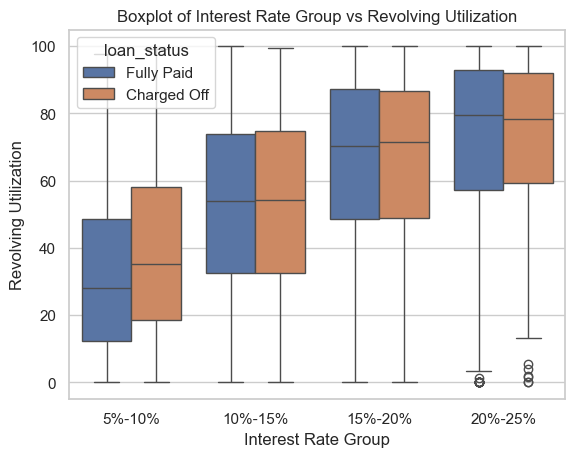

In [174]:
#3. Revolving Util vs Interest Rate Group.
# Create a boxplot to Compare Numerical Variables and Categorical Variables.
#Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
plotBoxForBivariate('int_rate_grp','revol_util',loan_data_df_curated_v2,'loan_status','Interest Rate Group','Revolving Utilization','Boxplot of Interest Rate Group vs Revolving Utilization')


We can see, Utilization of Revolving Credit is high for the Higer Rate Of interest Group. Means Borrowers with high interest rate are using revolving credit more. 

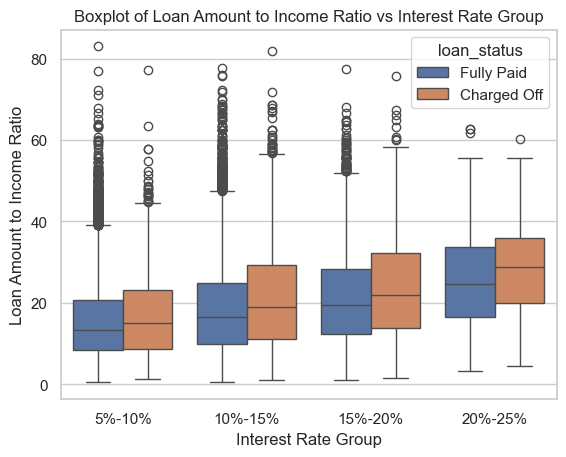

In [175]:
#4. Loan Amount to Income Ratio Vs Interest Rate Group
# Create a boxplot to Compare Numerical Variables and Categorical Variables.
#Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
plotBoxForBivariate('int_rate_grp','amnt_to_inc_ratio',loan_data_df_curated_v2,'loan_status','Interest Rate Group','Loan Amount to Income Ratio','Boxplot of Loan Amount to Income Ratio vs Interest Rate Group')

Pretty clear, Pattern looks fine as roi is less where  Loan to Income ratio is less.

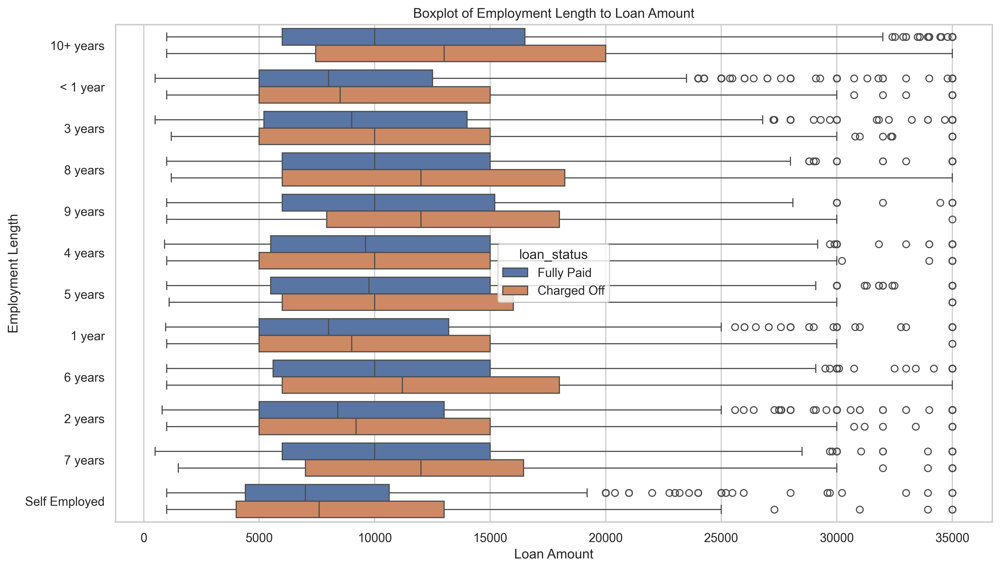

In [176]:
#5. Employment Length vs Loan Amount
plt.figure(figsize=(14, 8),dpi=300)
plotBoxForBivariate('loan_amnt','emp_length',loan_data_df_curated_v2,'loan_status','Loan Amount','Employment Length','Boxplot of Employment Length to Loan Amount')

Observation: Employment length 10+ years got more loan amount and got high number of times default
7,8,9 years median are almost same which is second-highest default

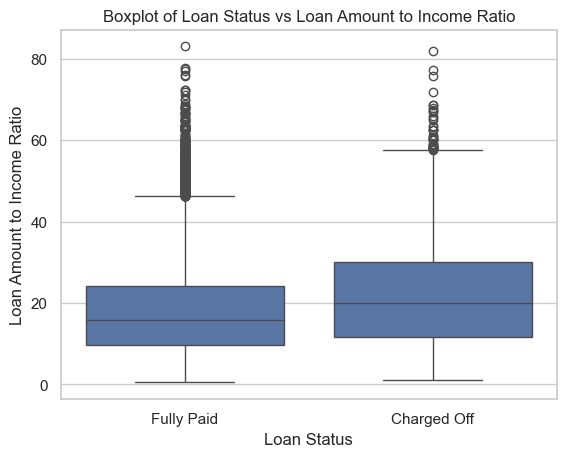

In [177]:
#6. Create a boxplot to Compare Numerical Variables and Categorical Variables.
#Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
sns.boxplot(x='loan_status', y='amnt_to_inc_ratio', data=loan_data_df_curated_v2)

# Set the labels and title
plt.xlabel('Loan Status')
plt.ylabel('Loan Amount to Income Ratio')
plt.title('Boxplot of Loan Status vs Loan Amount to Income Ratio')

# Display the plot
plt.show()


Interesting, Where Loan to Income Ratio is high, the default is also there. Average Default is happening at the ratio 20.

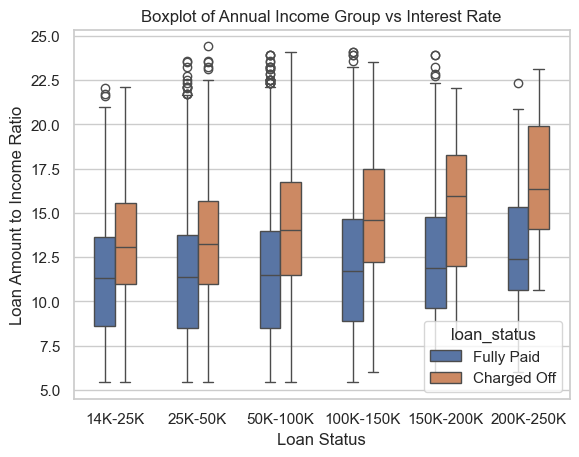

In [178]:
#7. Create a boxplot to Compare Numerical Variables and Categorical Variables.
#Revolving line utilization rate, or the amount of credit the borrower is using relative to all available revolving credit.
sns.boxplot(x='annual_inc_group', y='int_rate', data=loan_data_df_curated_v2,hue="loan_status",width=0.5)

# Set the labels and title
plt.xlabel('Loan Status')
plt.ylabel('Loan Amount to Income Ratio')
plt.title('Boxplot of Annual Income Group vs Interest Rate')

# Display the plot
plt.show()

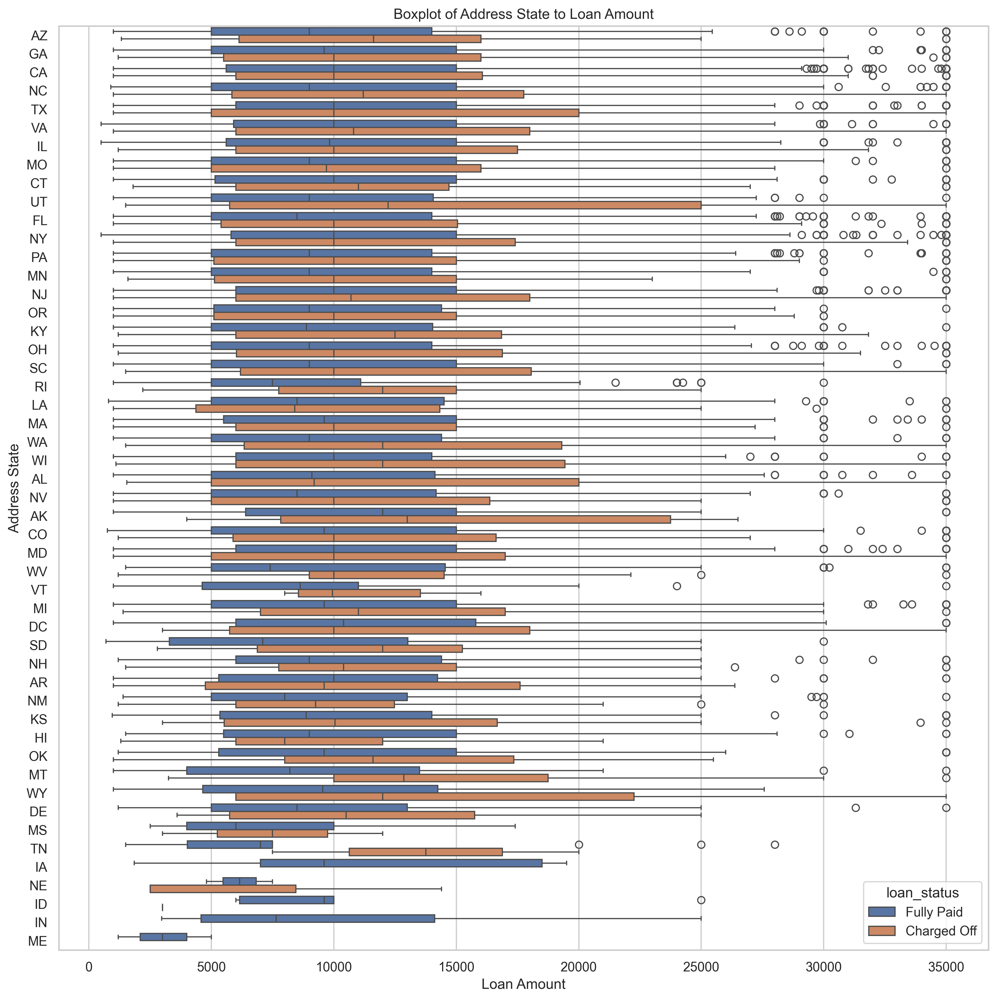

In [179]:
#8. State vs Loan Amount
plt.figure(figsize=(14, 14),dpi=300)
plotBoxForBivariate('loan_amnt','addr_state',loan_data_df_curated_v2,'loan_status','Loan Amount','Address State','Boxplot of Address State to Loan Amount')

- UT state is having Q3 at 25K loan Amount. 75% UT defaulted at 25K
- Then AK at 23K
- Then WY
- On Average, Many states got median of default near to 10K

##### Let's Start Bivariate Analysis Between Categorical and Categorical Features.

In [180]:
#Function to plot Count Plot for Bivariate Analysis. Specially For Categorical and Categorical Variables.
def plot_bivariate_countplot(df, label_of_plot, x, y,displayPercent):
    # Set the aesthetic style of the plots
    sns.set_style("whitegrid")
    
    # Create the countplot
    plt.figure(figsize=(10, 6), dpi=300)
    ax = sns.countplot(data=df, x=x, hue=y, palette='viridis')
    
    # Set the title and labels of the plot
    ax.set_title(label_of_plot)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right",fontsize='x-small')
    ax.set_ylabel('Count')
    
    # Annotate the top of each bar with its count
    if displayPercent==0:
        for p in ax.patches:
            ax.annotate(f'{int(p.get_height())}',
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha = 'center',
                        va = 'center',
                        xytext = (0, 10),
                        textcoords = 'offset points',
                        fontsize='xx-small',rotation=90)

    if displayPercent==1:
        total_height = sum(p.get_height() for p in ax.patches)

        # Annotate the top of each bar with its percentage
        for p in ax.patches:
            percentage = f'{100 * p.get_height() / total_height:.1f}%'  # Format the percentage with 1 decimal place
            ax.annotate(percentage,
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center',
                        va='center',
                        xytext=(0, 10),
                        textcoords='offset points',
                        fontsize='xx-small', rotation=45)
    
    # Display the legend
    plt.legend(title=y, loc='upper right')
    
    # Show the plot
    plt.show()

# Example usage:

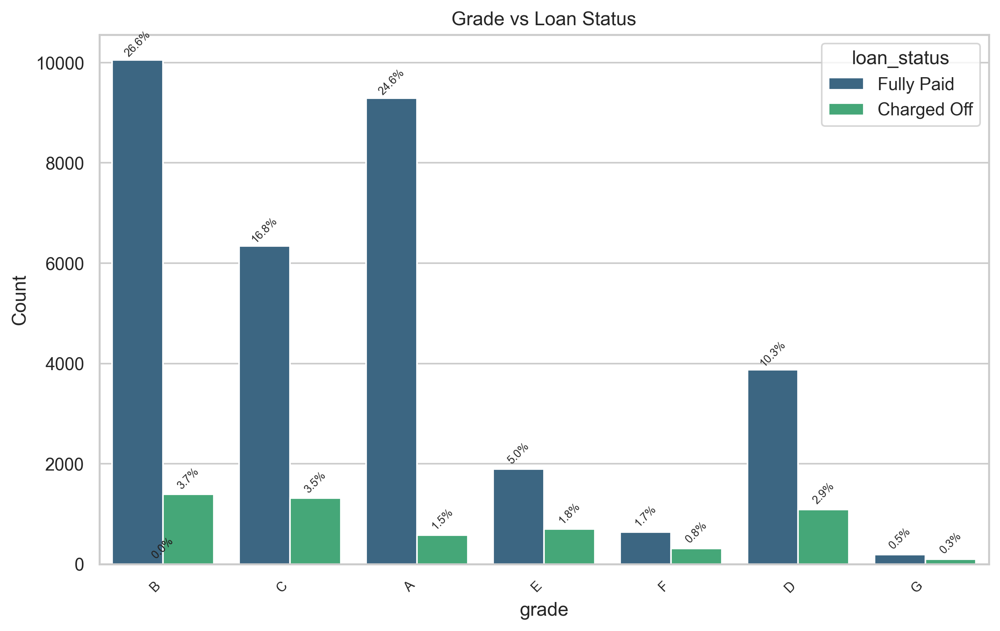

In [181]:
#1. Grade vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Grade vs Loan Status', 'grade', 'loan_status',1)


Observation - B, C and D grade has the maximum charged off.

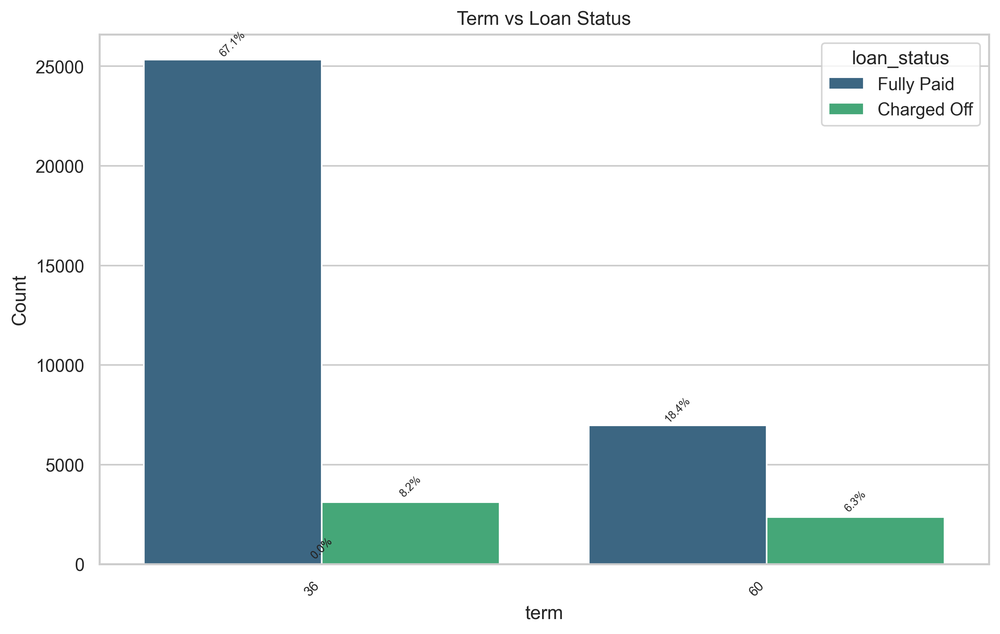

In [182]:
#2. Term vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Term vs Loan Status', 'term', 'loan_status',1)


Observation - Loan issued for 36 Months are the highest 8.2% charged off, Also Fully paid ratio is 67.1 % for 36 Months term loan.

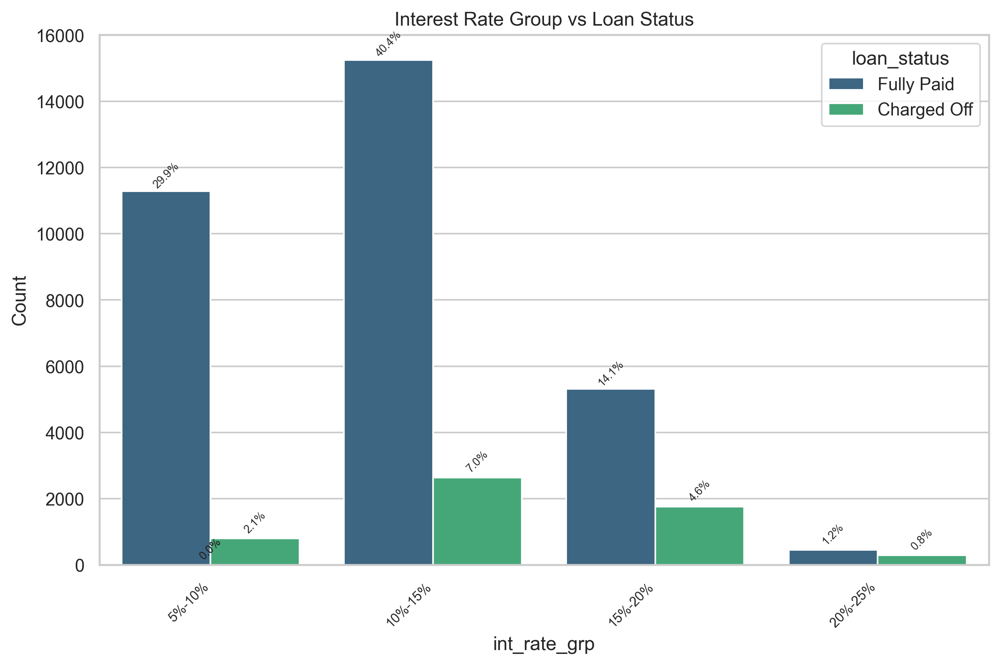

In [183]:
#3. Interest Rate Group vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Interest Rate Group vs Loan Status', 'int_rate_grp', 'loan_status',1)


Loans are charged off 7% of times when rate of interest is between 10-15%, followed by 4.6% when ROI is 15-20%

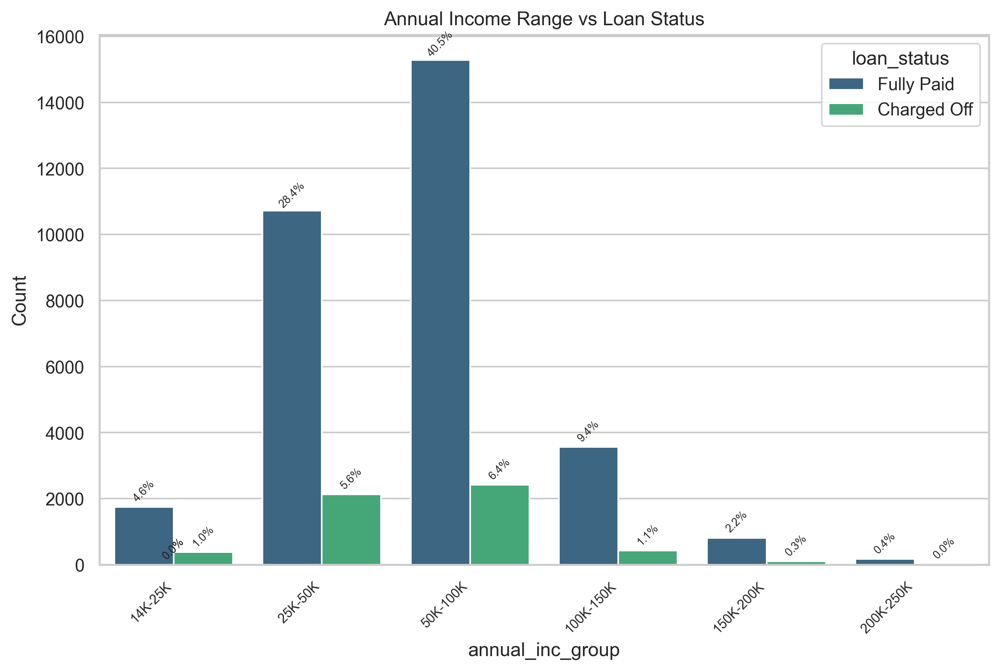

In [184]:
#4. Annual Income Range vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Annual Income Range vs Loan Status', 'annual_inc_group', 'loan_status',1)


Income group ranging from 50K-100K and 25K-50K are charged off highest no of times. 6.4% and 5.6% respectively.

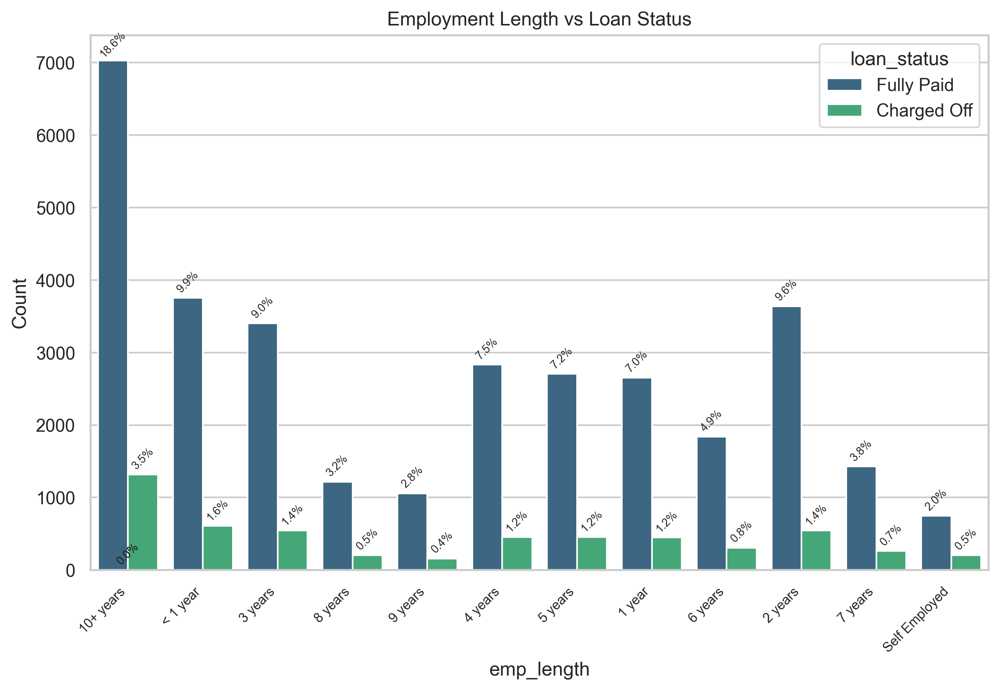

In [185]:
#5. Employment Length vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Employment Length vs Loan Status', 'emp_length', 'loan_status',1)


Applicants with 10+ years and then <1 Years are Defaulted number of times compared to others. 3.5% and 1.6%

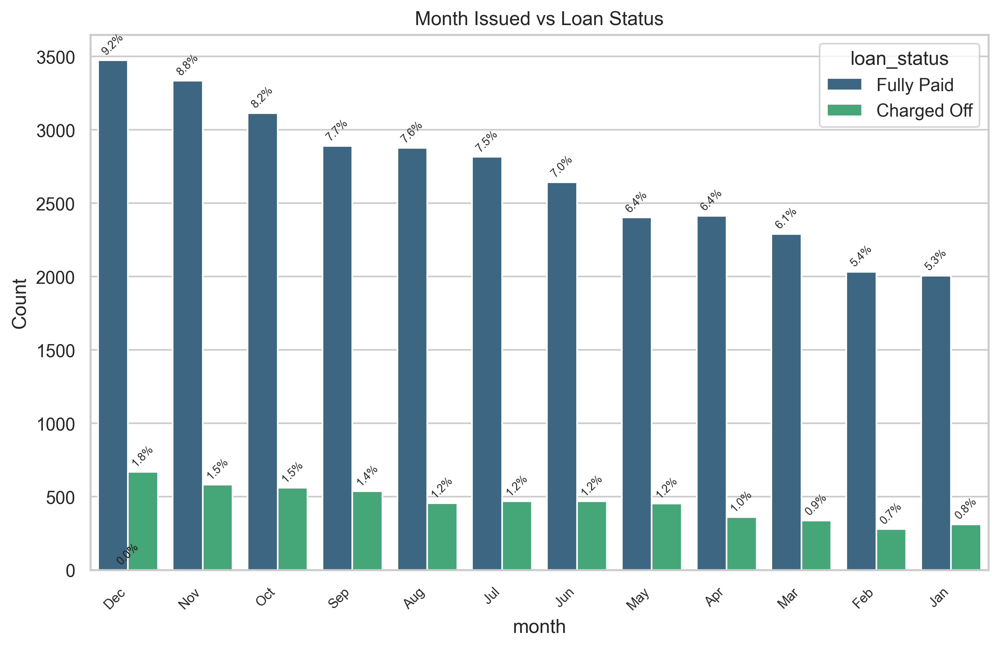

In [186]:
#6. Month Issued vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Month Issued vs Loan Status', 'month', 'loan_status',1)


December and Novembers Charged Off numbers are slightly higher compare to other months.

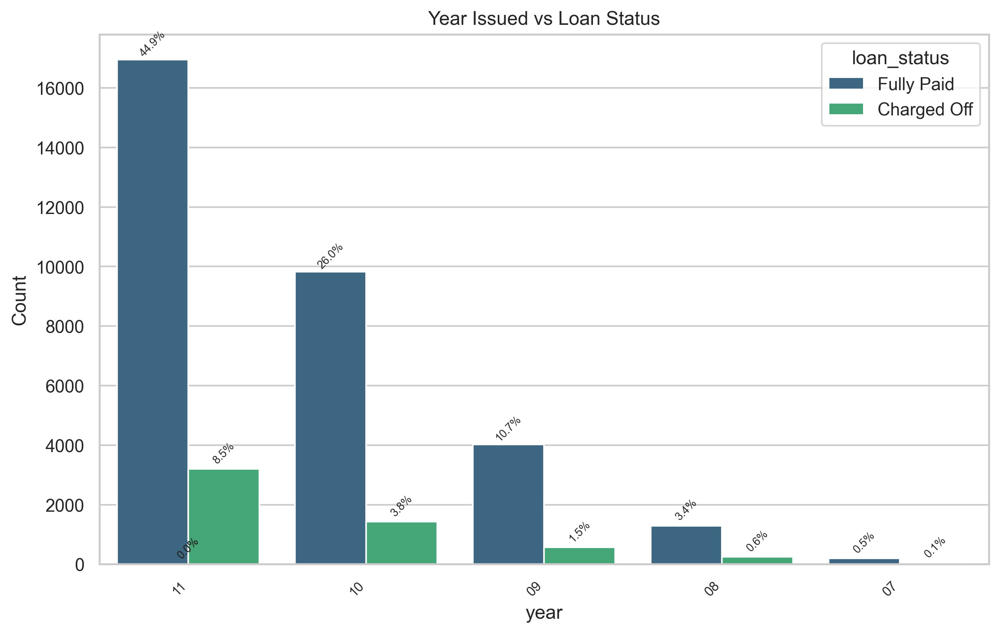

In [187]:
#7. Year Issued vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Year Issued vs Loan Status', 'year', 'loan_status',1)


In Year, 2011 Charged Off were the highest 8.5% significantly higher than other years.

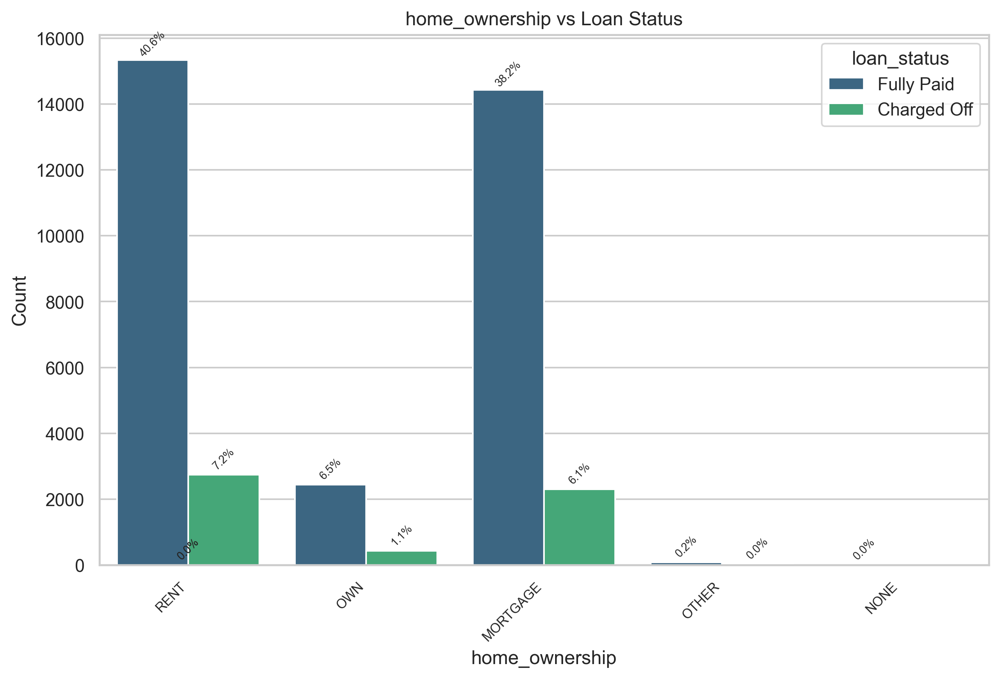

In [188]:
#8. Home Ownership vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'home_ownership vs Loan Status', 'home_ownership', 'loan_status',1)


7.2% Charged off are there when Home Ownership is Rent and then 6.1% when Mortgage.

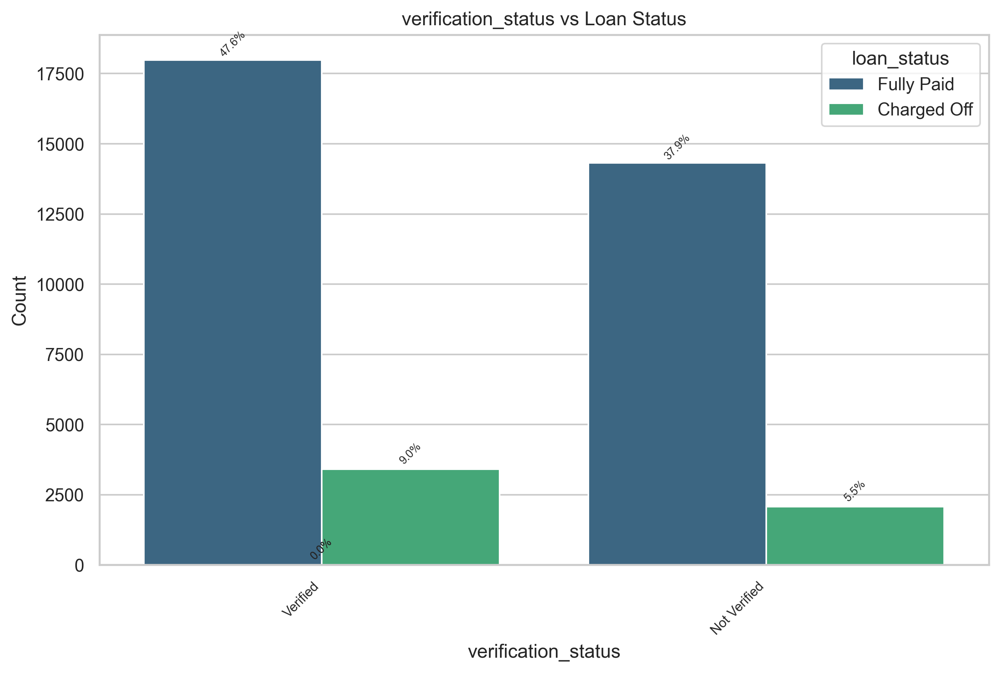

In [189]:
#9. verification_status vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'verification_status vs Loan Status', 'verification_status', 'loan_status',1)


9% Defaulted loan were verified. 7.2% Charged off are there when Home Ownership is Rent and then 6.1% when Mortgage.

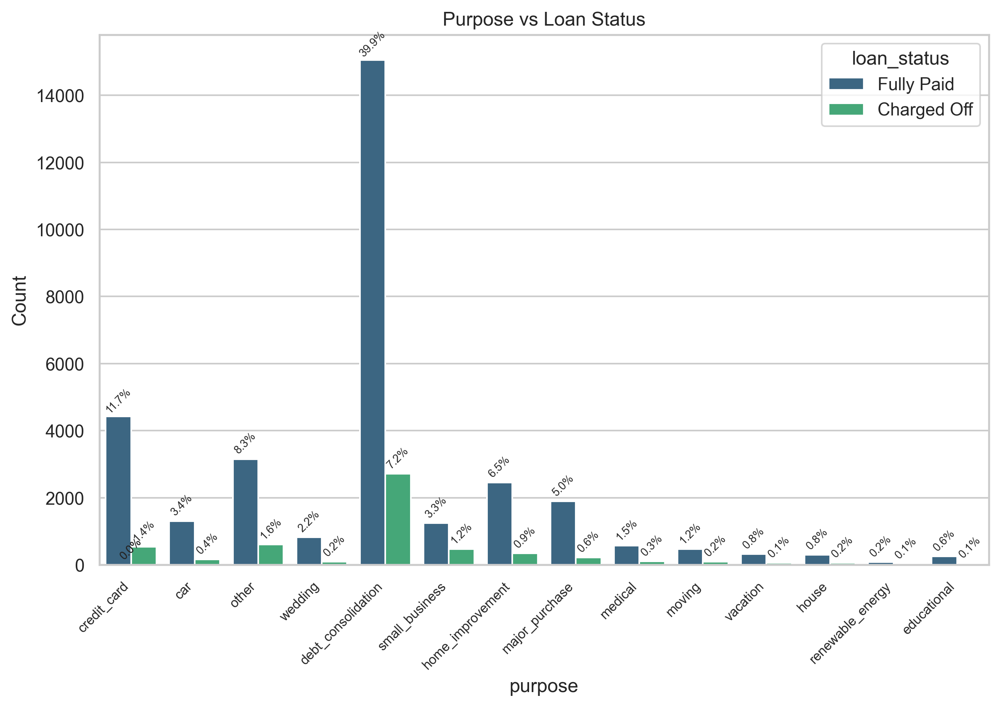

In [190]:
#10. Purpose vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'Purpose vs Loan Status', 'purpose', 'loan_status',1)


7.2% Loans defaulted were for Debt_Consolidation, And the 1.6% for Other Purpose.


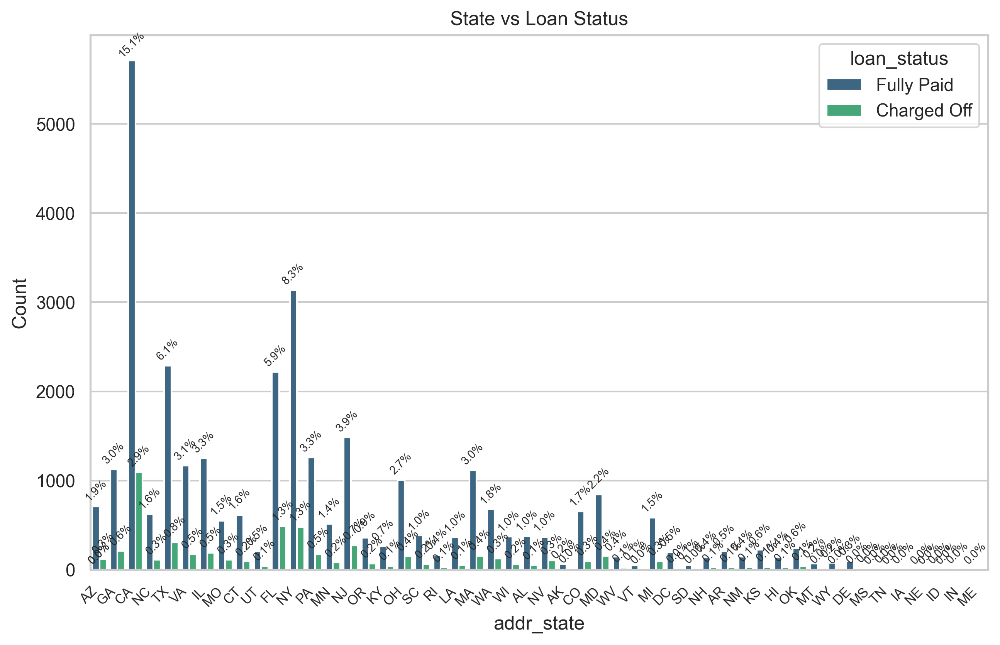

In [191]:
#11. Address State vs Loan Status
plot_bivariate_countplot(loan_data_df_curated_v2, 'State vs Loan Status', 'addr_state', 'loan_status',1)


CA, NY and FL states got the highest number of default loan.

### Let me summarise BiVariate Analysis

- Loan Amount and Interest Rate Group can’t be compared with respect to Loan Status as there’s no big difference.
- Loan Amount, Fund Amount and Investor Fund Amount are positively correlate by 1
- Total Received Principle and Total Payment received correlating with Loan Amount by 0.84 which is positive correlate

- B, C and D grade has the highest charged off.
- Loan issued for 36 Months are the highest 8.2% charged off, Also Fully paid ratio is 67.1 % for 36 Months term loan.
- Loans are charged off 7% of times when rate of interest is between 10-15%, followed by 4.6% when ROI is 15-20%
- Income group ranging from 50K-100K and 25K-50K are charged off highest no of times. 6.4% and 5.6% respectively.
- Applicants with 10+ years and then <1 Years are Defaulted number of times compared to others. 3.5% and 1.6%
- December and Novembers Charged Off numbers are slightly higher compare to other months.
- In Year, 2011 Charged Off were the highest 8.5% significantly higher than other years.
- 7.2% Charged off are there when Home Ownership is Rent and then 6.1% when Mortgage.
- 9% Defaulted loan were verified. 7.2% Charged off are there when Home Ownership is Rent and then 6.1% when Mortgage.
- 7.2% Loans defaulted were for Debt_Consolidation, And the 1.6% for Other Purpose.
- CA, NY and FL states got the highest number of default loan.
*****************


Total 11 Categorical vs Categorical Features are completed for Bivariate Analysis.

## Multivariate Analysis

In [192]:
numerical_features = loan_data_df_curated_v2.select_dtypes(exclude=['object', 'category']).columns.tolist()
loan_data_df_curated_v2[numerical_features].head()


,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,annual_inc,dti,revol_util,total_pymnt,total_pymnt_inv,total_rec_prncp,last_pymnt_amnt,amnt_to_inc_ratio,loan_status_indicator
0,5000,5000,4975,36,10.65,162.87,24000,27.65,83.7,5863.155187,5833.84,5000.00,171.62,20.833333,0
1,2500,2500,2500,60,15.27,59.83,30000,1.00,9.4,1008.710000,1008.71,456.46,119.66,8.333333,1
3,10000,10000,10000,36,13.49,339.31,49200,20.00,21.0,12231.890000,12231.89,10000.00,357.48,20.325203,0
5,5000,5000,5000,36,7.90,156.46,36000,11.20,28.3,5632.210000,5632.21,5000.00,161.03,13.888889,0
6,7000,7000,7000,60,15.96,170.08,47004,23.51,85.6,10110.840000,10110.84,6985.61,1313.76,14.892350,0


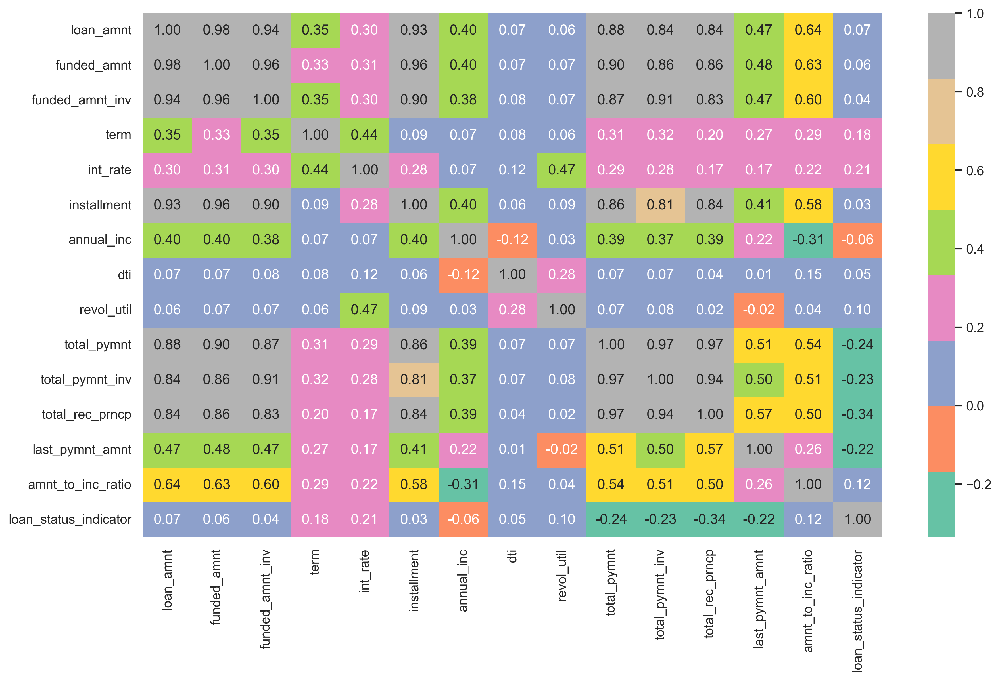

In [193]:
#Let's Plot Heat Map to see correlations between numeric variables.
plt.figure(figsize=(14, 8),dpi=300)
sns.heatmap(loan_data_df_curated_v2[numerical_features].corr(), annot=True, fmt=".2f",cmap='Set2')

# Display the heatmap
plt.show()

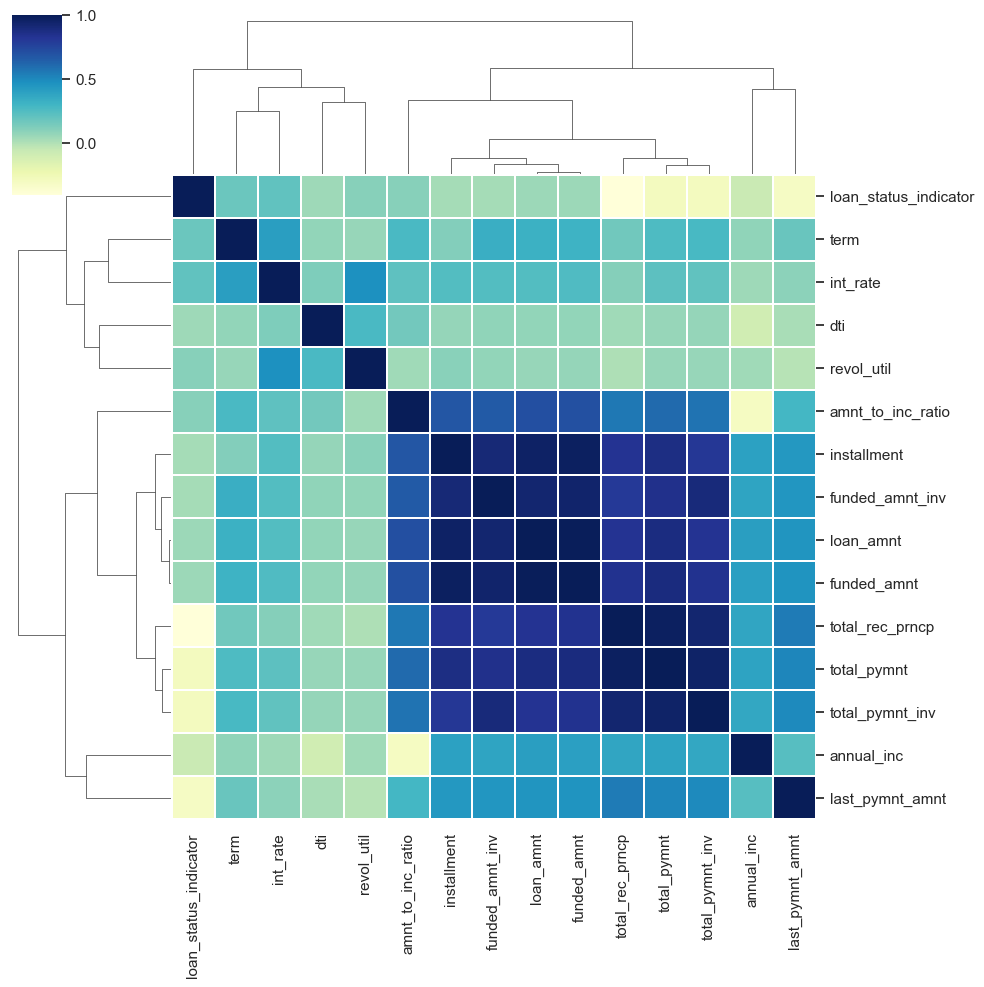

In [194]:
#correlation matrix for numeric features. 
corrmat = loan_data_df_curated_v2[numerical_features].corr(method='spearman')
cg = sns.clustermap(corrmat, cmap="YlGnBu", linewidths=0.1)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg

This is easier to see correlation between numeric variables.

Highly Positive Correlation
- Loan Amount , Fund Amount, Investor Fund Amount are positively correlate
- Total Received Principle and Total Payment received are Correlating with Loan Amount by 0.84
- Term and Interest Rate are also positively correlating


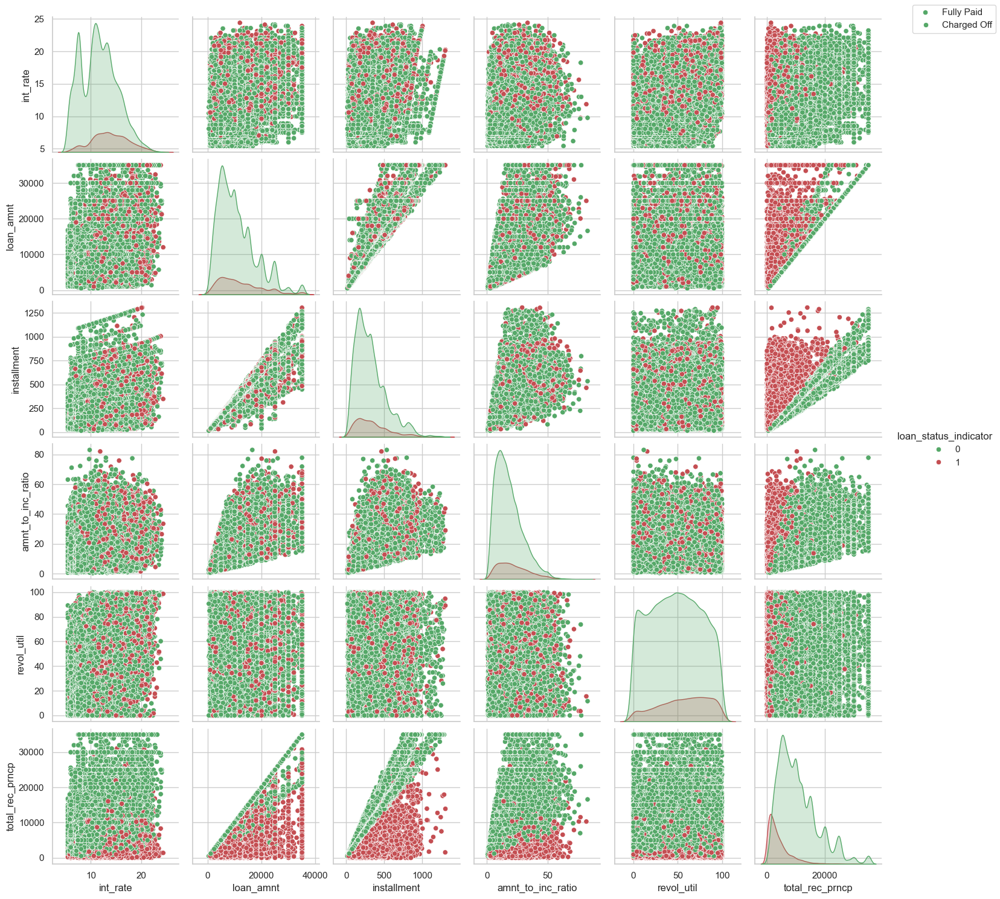

In [195]:
#Multivariate Analysis with Scatter Plots. 
ax = sns.pairplot(loan_data_df_curated_v2[['int_rate','loan_amnt','installment','amnt_to_inc_ratio','revol_util','loan_status_indicator','total_rec_prncp']],hue="loan_status_indicator",palette=["g","r"])
ax.fig.legend(labels=['Fully Paid','Charged Off'])
plt.show()

1. Interestingly, after receiving 10K USD Principle in general there are fewer defaulters, Ranging Interest Rate between 10-20%
2. Loan Amount to Income Ration is correlated highly.


In [196]:
#Creating CrossTab Function and Preparing the tableData
def calc_default_percentage_default(loanData,col) :

    output_default = pd.crosstab(loanData[col], loanData['loan_status'],margins=True)
    output_default['All'] = output_default['Charged Off'] + output_default['Fully Paid']
    output_default['Loan Default Percentage'] = round((output_default['Charged Off']*100/output_default['All']),2)

    # remove last row with sum total
    output_default = output_default[0:-1]
    return output_default



In [197]:
#Function to display Cross Tab Table, and also Plot the bar chart with showing Loan Default Tendency.
#Line Chart created to show Loan Default tendency based on the Loan Default Percentage
def multivariate_Analysis_Plot(loanData,col,displayTable, stacked=False):

    table_data = calc_default_percentage_default(loanData,col)

    if displayTable:
        display(table_data)

    #line plot to display Default Tendency
    linePlot = table_data[['Loan Default Percentage']]
    line = linePlot.plot(figsize=(20,8), marker='o',color = 'r',lw=2)
    line.set_title(loanData[col].name.title()+' vs Loan Default Tendency Percentage',fontsize=20,weight="bold")
    line.set_xlabel(loanData[col].name.title())
    line.set_ylabel('Loan Default Tendency Percentage')

    #bar plot of passed data, All the raws and First 4 columns.
    barPlot =  table_data.iloc[:,0:3]
    bar = barPlot.plot(kind='bar',ax = line,rot=1,secondary_y=True,stacked=stacked)
    bar.set_ylabel('Number of Loans')

    plt.show()

loan_status,Charged Off,Fully Paid,All,Loan Default Percentage
grade,,,,
A,581,9291,9872,5.89
B,1389,10054,11443,12.14
C,1313,6347,7660,17.14
D,1088,3879,4967,21.90
E,698,1892,2590,26.95
F,312,639,951,32.81
G,99,190,289,34.26


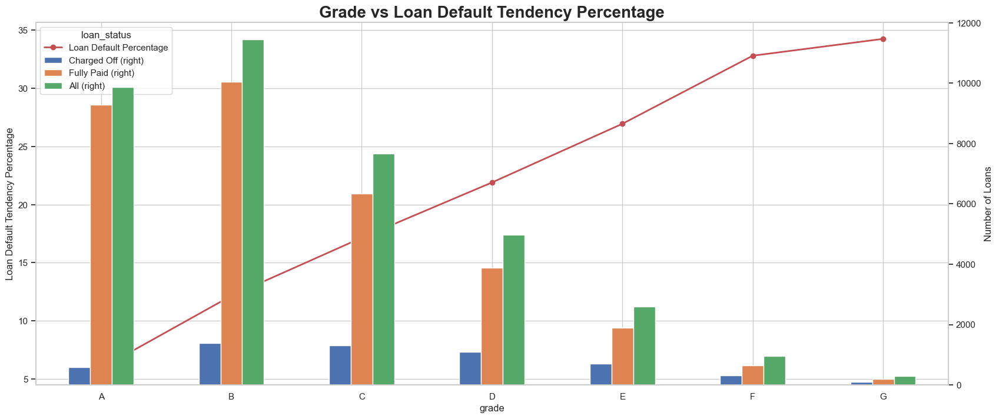

In [198]:
#1 - Grade vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'grade',1,stacked=False)

Grade A to Grade G default tendency is Increasing. 

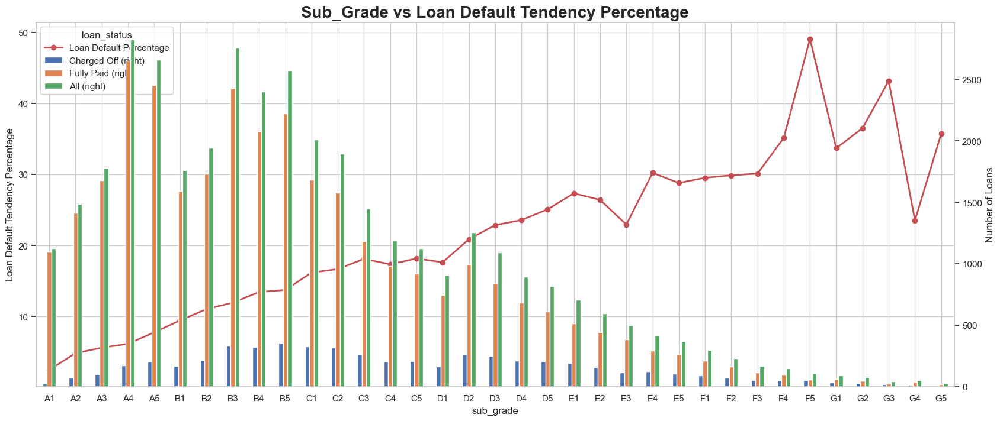

In [199]:
#2 - Sub Grade vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'sub_grade',0,stacked=False)

Sub Grade F5, G3, G5 has the highest tendency to default to Compare to A4,A5, B3,B5 where total defaulters are more because total loans issued are also more. 

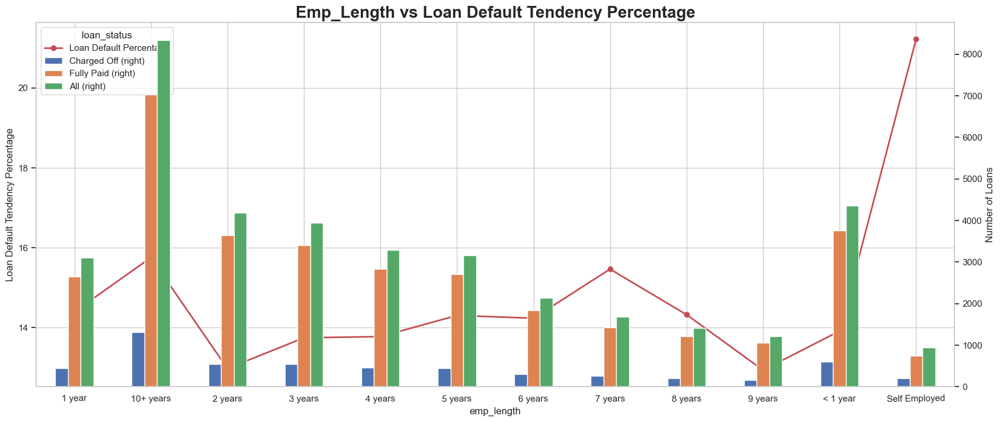

In [200]:
#3 - Sub Grade vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'emp_length',0,stacked=False)

Self Employed has the highest tendency to default (23%), then 10+ and 7 Years. 

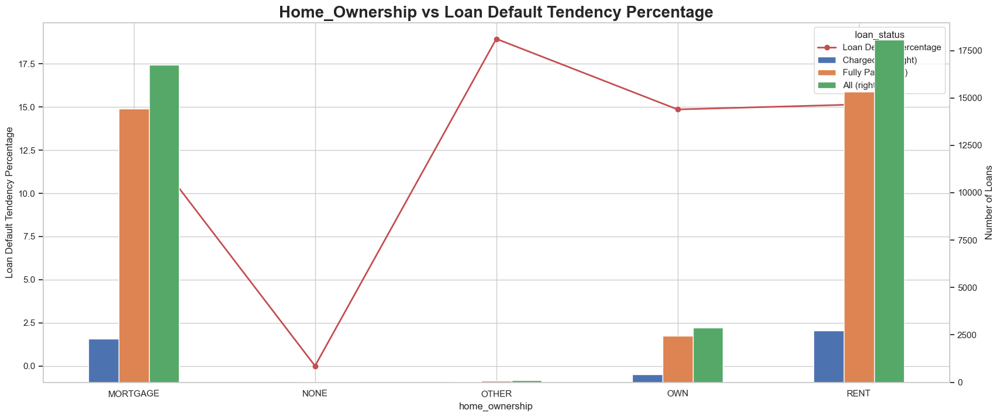

In [201]:
#4 - Home_Ownership vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'home_ownership',0,stacked=False)

Home Ownership with Other (18.5%) and Own and Rent has more tendency to default. 

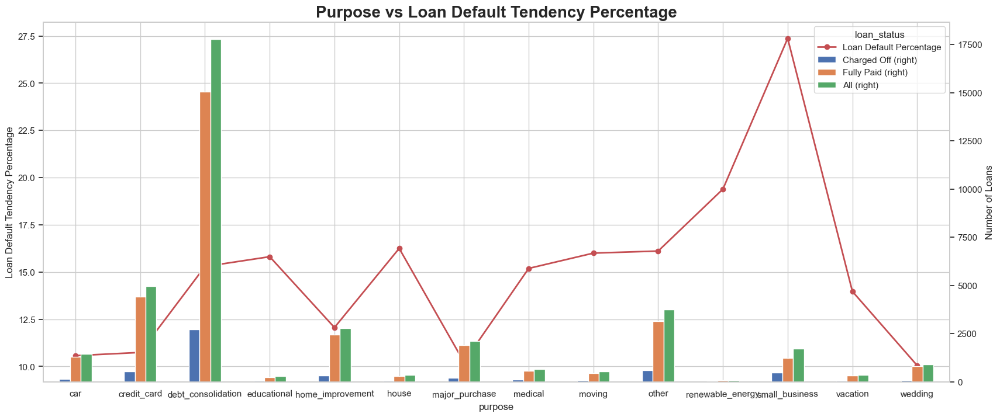

In [202]:
#5 - Purpose vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'purpose',0,stacked=False)

Small Business has the more tendency (27.5%) to default and then Renewable Energy and then Other/House (18%) 

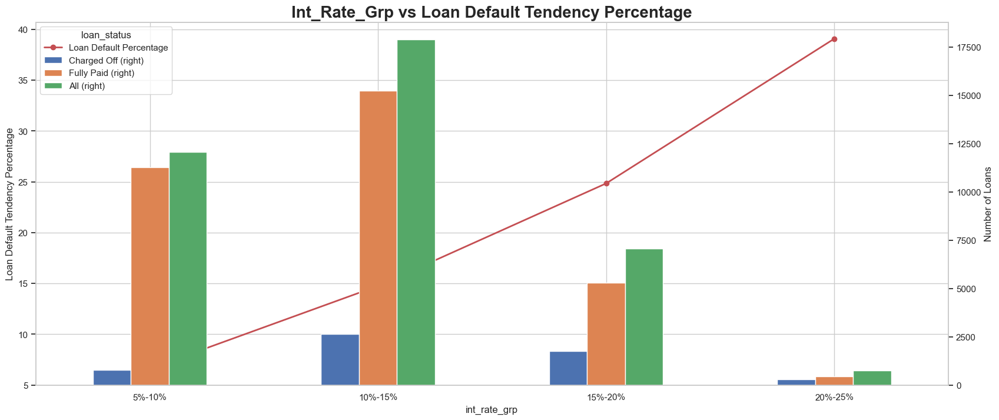

In [203]:
#6 - Interest Rate Group vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'int_rate_grp',0,stacked=False)

With higher Rate of interest tendency to default is high which is near to 40% 

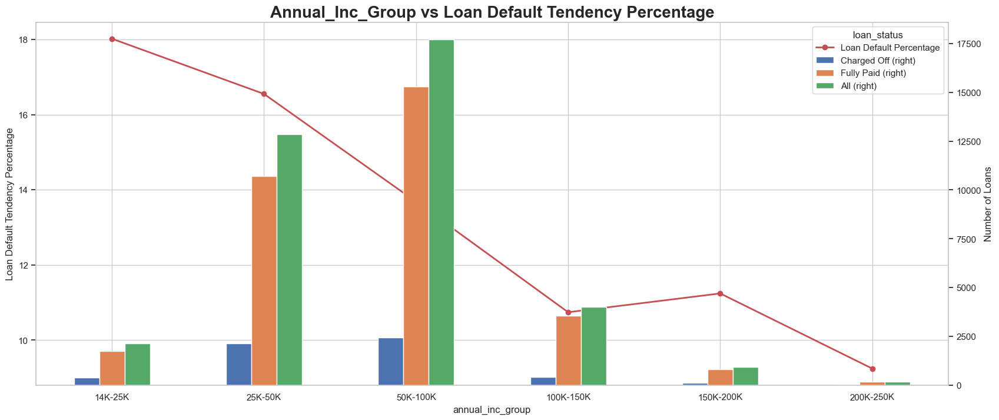

In [204]:
#7 - Annual Income Group vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'annual_inc_group',0,stacked=False)

14K-50K USD income group has the more tendency to default almost 18% 

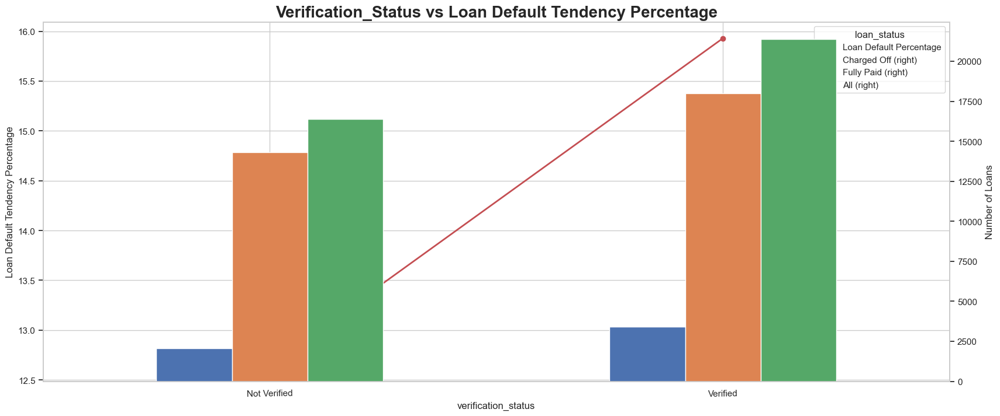

In [205]:
#8 - Verification Status vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'verification_status',0,stacked=False)

Interestingly Verified borrowers got defaulted more times than Non Verified. 

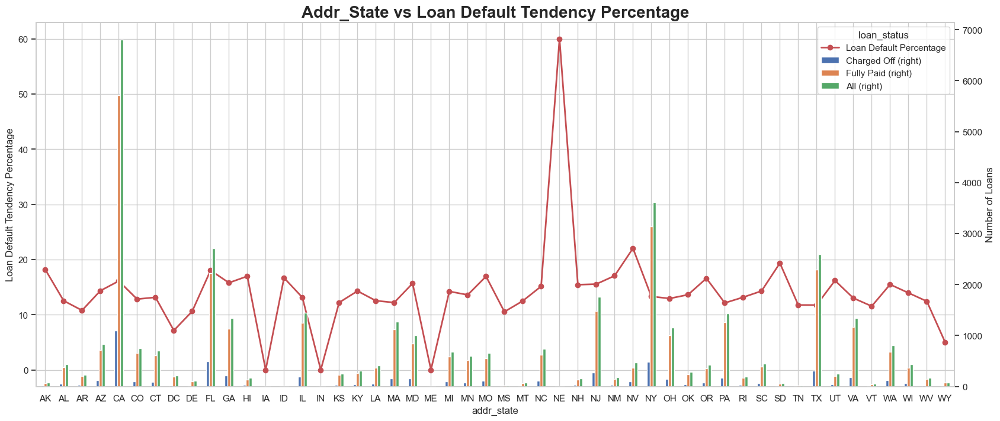

In [206]:
#8 - Address State vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'addr_state',0,stacked=False)

NE - 60%, NV ~22%, SD-20%, AK-18% with the highest default rate

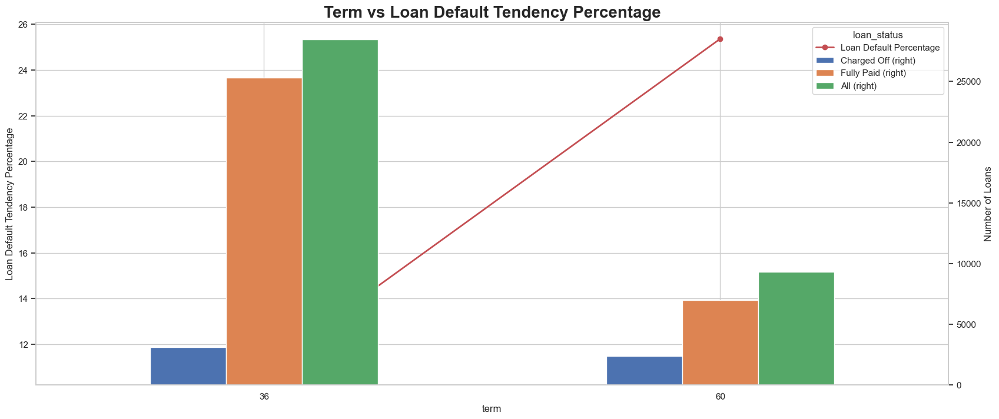

In [207]:
#9 - Term vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'term',0,stacked=False)

Term 60 Months has the default rate higher. 

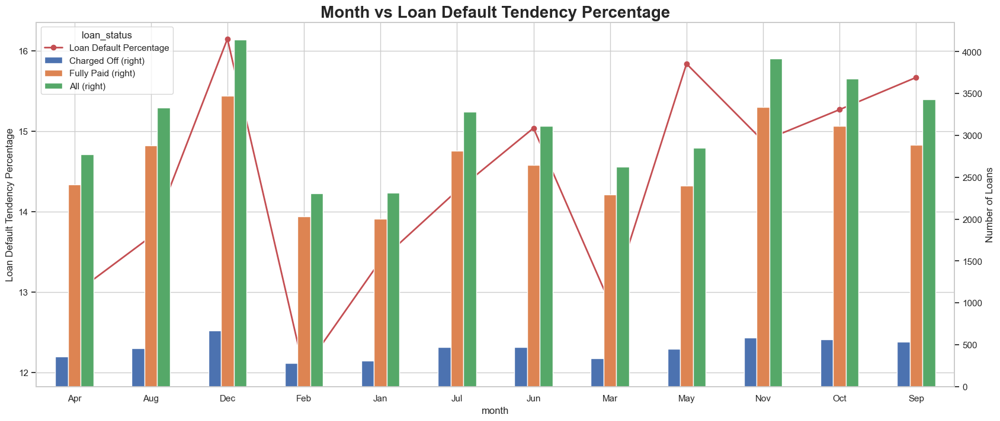

In [208]:
#10 - Month vs Loan Default Tendency
multivariate_Analysis_Plot(loan_data_df_curated_v2, 'month',0,stacked=False)

Dec, September and May higher default tendency is noticed. 

### Now, Let's Summarize Multivariate Analysis Observations.

1. Fund Amount, Investor Fund Amount are equally correlated with Loan Amount
2. Interestingly, after receiving 10K USD Principle in general there are fewer defaulters, Ranging Interest Rate between **10-20%**
3. Loan Amount vs Amount to Income Ratio is correlated highly.
4. Dec, September and May months has higher default tendency rate near to 16% 
5. Term 60 Months has the default rate higher near to **25%** 
6. NE - **60%**, NV ~22%, SD-20%, AK-18% states where borrowers defaulted maximum
7. Interestingly Verified borrowers got defaulted more times than Non Verified. 
8. 14K-50K USD income group has the more tendency to default by **16-18%**  
9. With higher Rate of interest tendency to default is high near to **40%** 
10. Small Business has the more tendency **(27.5%)** to default and then Renewable Energy and then Other/House.    
11. Home Ownership (18.5%) with Other and Own and Rent has more tendency to default. 
12. Self Employed has the highest tendency **(23%)** to default, then 10+ and 7 Years. 
13. Sub Grade **F5(49%)**, G3, G5 has the highest tendency to default to Compare to A4,A5, B3,B5 where total defaulters are more because total loans issued are also more.
14. In Grade A to Grade G **(34%)** borrowers default tendency is increased.


#### Conclusions:
As per the above EDA analysis, we have certainly found out some key driving factors for Charged off loans. Below are the key driving attributes. 

1. Address State 
2. Interest Rate 
3. Grade and Sub grade
4. Purpose
5. Employment Length
6. Home Ownership 
7. Term 
8. Verification Status
9. Issued Month
10. Loan Amount to Annual Income Ratio
11. Revolving Credit Line Ratio


********** END OF BOOK *******